<a href="https://colab.research.google.com/github/akalakkad/Silly-Gans/blob/master/BANANA_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Banana GAN
A quick exercise with training a DCGAN (Deep Convolutional Generative Adversarial Network) on a image set of Bananas. Roughly 400 images in Training and something like quarter of that in Test. Parameters include a batch size of 32, and eval size of 16, 100 epochs, and a g_beta_1 and d_beta_1 of .4. Not sure what all of these mean perfectly yet, or fundamentally how to construct a DCGAN, but images come out pretty clear by the end of all of the tweaking. 

GAN can generate bananas from multiple angles, with details such as shadow, spotting on the stem and side, and coloration. Profile angle is best, but that is to be expected. 

Naoki Shibuya made an incredible tutorial on implementing DCGAN [here](https://https://github.com/naokishibuya/deep-learning/blob/master/python/dcgan_svhn.ipynb) The code I used was from here, definitely check it out!

In [0]:
!git clone https://github.com/Horea94/Fruit-Images-Dataset

Cloning into 'Fruit-Images-Dataset'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 360094 (delta 6), reused 0 (delta 0), pack-reused 360079
Receiving objects: 100% (360094/360094), 1.99 GiB | 29.84 MiB/s, done.
Resolving deltas: 100% (1011/1011), done.
Checking out files: 100% (65444/65444), done.


In [0]:
import os
import numpy as np
import keras
import keras.backend as K
from keras.layers import Dense, Activation, LeakyReLU, BatchNormalization
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.models import Sequential
from keras.optimizers import Adam
import matplotlib.pyplot as plt

from PIL import Image

Using TensorFlow backend.


In [0]:
ls Fruit-Images-Dataset/Training/Banana/

0_100.jpg    219_100.jpg  51_100.jpg     r_144_100.jpg  r_262_100.jpg
10_100.jpg   220_100.jpg  52_100.jpg     r_145_100.jpg  r_263_100.jpg
104_100.jpg  221_100.jpg  53_100.jpg     r_146_100.jpg  r_264_100.jpg
107_100.jpg  222_100.jpg  54_100.jpg     r_147_100.jpg  r_265_100.jpg
1_100.jpg    223_100.jpg  55_100.jpg     r_148_100.jpg  r_266_100.jpg
11_100.jpg   224_100.jpg  56_100.jpg     r_149_100.jpg  r_267_100.jpg
112_100.jpg  225_100.jpg  57_100.jpg     r_150_100.jpg  r_268_100.jpg
117_100.jpg  226_100.jpg  58_100.jpg     r_151_100.jpg  r_269_100.jpg
118_100.jpg  227_100.jpg  59_100.jpg     r_152_100.jpg  r_270_100.jpg
119_100.jpg  228_100.jpg  60_100.jpg     r_153_100.jpg  r_27_100.jpg
120_100.jpg  229_100.jpg  6_100.jpg      r_154_100.jpg  r_271_100.jpg
121_100.jpg  230_100.jpg  61_100.jpg     r_155_100.jpg  r_272_100.jpg
122_100.jpg  231_100.jpg  62_100.jpg     r_156_100.jpg  r_273_100.jpg
123_100.jpg  232_100.jpg  63_100.jpg     r_157_100.jpg  r_274_100.jpg
124_100.jpg  233_100.

In [0]:
path = "Fruit-Images-Dataset/Training/Banana/"

In [0]:
X_train = []
y_train = []
X_test = []
y_test = []

In [0]:
def imagetoarray(path):
  for p in os.listdir(path):
    img = Image.open(path + "/" + p)
    resize = img.resize((32,32))
    img_array = np.array(resize, dtype='float32')
    X_train.append(img_array)
    y_train.append(1)

In [0]:
imagetoarray(path)

In [0]:
X_train = np.array(X_train)
y_train = np.array(y_train)

In [0]:
print(X_train.shape)

(490, 32, 32, 3)


In [0]:
def testimagetoarray(path):
  for p in os.listdir(path):
    img = Image.open(path + "/" + p)
    resize = img.resize((32,32))
    img_array = np.array(resize, dtype='float32')
    X_test.append(img_array)
    y_test.append(1)

In [0]:
path = 'Fruit-Images-Dataset/Test/Banana/'

In [0]:
testimagetoarray(path)

In [0]:
X_test = np.array(X_test)
y_test = np.array(y_test)

In [0]:
print(X_test.shape)

(166, 32, 32, 3)


In [0]:
def preprocess(x):
  
  return(x/255)*2-1

In [0]:
def deprocess(x):
  
  return np.uint8((x+1)/2*255)

In [0]:
X_train_real = preprocess(X_train)
X_test_real = preprocess(X_test)

In [0]:
def make_generator(input_size, leaky_alpha):
  
  return Sequential([
      Dense(4*4*512, input_shape=(input_size,)),
      Reshape(target_shape=(4,4,512)),
      BatchNormalization(),
      LeakyReLU(alpha = leaky_alpha),
      Conv2DTranspose(256, kernel_size=5, strides=2, padding='same'),
      BatchNormalization(),
      LeakyReLU(alpha = leaky_alpha),
      Conv2DTranspose(128, kernel_size=5, strides=2, padding='same'),
      BatchNormalization(),
      LeakyReLU(alpha = leaky_alpha),
      Conv2DTranspose(3, kernel_size=5, strides=2, padding='same'),
      Activation('tanh')
  ])

In [0]:
def make_discriminator(leaky_alpha):
  
  return Sequential([
      Conv2D(64, kernel_size=5, strides=2, padding='same', input_shape=(32,32,3)),
      LeakyReLU(alpha=leaky_alpha),
      Conv2D(128, kernel_size=5, strides=2, padding='same'),
      BatchNormalization(),
      LeakyReLU(alpha=leaky_alpha),
      Conv2D(256, kernel_size=5, strides=2, padding='same'),
      BatchNormalization(),
      LeakyReLU(alpha=leaky_alpha),
      Flatten(),
      Dense(1), 
      Activation('sigmoid')
  ])

In [0]:
def make_DCGAN(sample_size, g_learning_rate, g_beta_1, d_learning_rate, d_beta_1, leaky_alpha):
  K.clear_session()
  
  generator = make_generator(sample_size, leaky_alpha)
  
  discriminator = make_discriminator(leaky_alpha)
  discriminator.compile(optimizer=Adam(lr=d_learning_rate, beta_1=d_beta_1), loss='binary_crossentropy')
  
  gan = Sequential([generator, discriminator])
  gan.compile(optimizer=Adam(lr=g_learning_rate, beta_1=g_beta_1), loss='binary_crossentropy')
  
  return gan, generator, discriminator

In [0]:
def make_latent_samples(n_samples, sample_size):
  
  return np.random.normal(loc=0, scale=1, size=(n_samples, sample_size))

In [0]:
def make_trainable(model, trainable):
  for layer in model.layers:
    layer.trainable = trainable

In [0]:
def make_labels(size):
  
  return np.ones([size, 1]), np.zeros([size, 1])

In [0]:
def show_losses(losses):
  losses = np.array(losses)
  
  fig, ax = plt.subplots()
  plt.plot(losses.T[0], label='Discriminator')
  plt.plot(losses.T[1], label='Generator')
  plt.title("Validation Losses")
  plt.legend()
  plt.show()

In [0]:
def show_image(generated_images):
  n_images = len(generated_images)
  cols = 10
  rows = n_images // cols
  
  plt.figure(figsize=(10,8))
  for i in range(n_images):
    img = deprocess(generated_images[i])
    ax = plt.subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
  
  plt.tight_layout()
  plt.show()

In [0]:
def train(g_learning_rate, g_beta_1,
          d_learning_rate, d_beta_1,
          leaky_alpha, smooth=0.1,
          sample_size=100,
          epochs=100,
          batch_size=32,
          eval_size=12,
          show_details= True):
  
  y_train_real, y_train_fake = make_labels(batch_size)
  y_eval_real, y_eval_fake = make_labels(eval_size)
  
  gan, generator, discriminator = make_DCGAN(sample_size,
                                            g_learning_rate,
                                            g_beta_1,
                                            d_learning_rate,
                                            d_beta_1,
                                            leaky_alpha)
  losses = []
  
  for e in range(epochs):
    for i in range(len(X_train_real) // batch_size):
      
      X_batch_real = X_train_real[i*batch_size:(i+1)*batch_size]
      
      latent_samples = make_latent_samples(batch_size, sample_size)
      X_batch_fake = generator.predict_on_batch(latent_samples)
      
      make_trainable(discriminator, True)
      discriminator.train_on_batch(X_batch_real, y_train_real * (1 - smooth))
      discriminator.train_on_batch(X_batch_fake, y_train_fake)
      
      make_trainable(discriminator, False)
      gan.train_on_batch(latent_samples, y_train_real)
      
    X_eval_real = X_test_real[np.random.choice(len(X_test_real), eval_size, replace=False)]
    
    latent_samples = make_latent_samples(eval_size, sample_size)
    X_eval_fake = generator.predict_on_batch(latent_samples)
    
    d_loss = discriminator.test_on_batch(X_eval_real, y_eval_real)
    d_loss += discriminator.test_on_batch(X_eval_fake, y_eval_fake)
    g_loss = gan.test_on_batch(latent_samples, y_eval_real)
    
    losses.append((d_loss, g_loss))
    
    print("Epoch: {:>3}/{} Discriminator Loss: {:>7.4f}  Generator Loss: {:>7.4f}".format(
            e+1, epochs, d_loss, g_loss))
      
    if((e+1) % 5 == 0 ):
      show_image(X_eval_fake[:10])
  
  if show_details:
    show_losses(losses)
    show_image(generator.predict(make_latent_samples(80, sample_size)))
  
  return generator

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  1.8150  Generator Loss:  0.3434
Epoch:   2/100 Discriminator Loss:  0.0000  Generator Loss: 16.1181
Epoch:   3/100 Discriminator Loss:  0.7117  Generator Loss:  2.8595
Epoch:   4/100 Discriminator Loss:  2.8014  Generator Loss:  2.4812
Epoch:   5/100 Discriminator Loss:  3.6008  Generator Loss: 16.1181


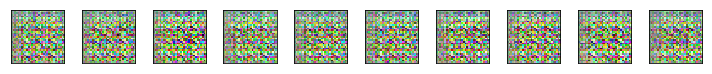

Epoch:   6/100 Discriminator Loss:  5.4310  Generator Loss: 16.1181
Epoch:   7/100 Discriminator Loss:  4.2700  Generator Loss: 16.1181
Epoch:   8/100 Discriminator Loss:  2.7298  Generator Loss:  0.8980
Epoch:   9/100 Discriminator Loss:  4.1565  Generator Loss:  0.9708
Epoch:  10/100 Discriminator Loss:  3.4645  Generator Loss: 16.1181


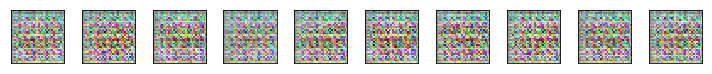

Epoch:  11/100 Discriminator Loss:  0.1769  Generator Loss:  2.6169
Epoch:  12/100 Discriminator Loss:  1.6374  Generator Loss:  2.5157
Epoch:  13/100 Discriminator Loss:  1.3956  Generator Loss:  3.4684
Epoch:  14/100 Discriminator Loss:  1.6436  Generator Loss:  1.5947
Epoch:  15/100 Discriminator Loss:  3.0734  Generator Loss:  3.4803


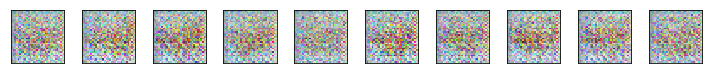

Epoch:  16/100 Discriminator Loss: 14.1357  Generator Loss: 10.6851
Epoch:  17/100 Discriminator Loss:  1.1566  Generator Loss:  3.9491
Epoch:  18/100 Discriminator Loss:  3.2153  Generator Loss:  3.8155
Epoch:  19/100 Discriminator Loss:  4.6603  Generator Loss:  2.8844
Epoch:  20/100 Discriminator Loss:  4.3293  Generator Loss:  3.7373


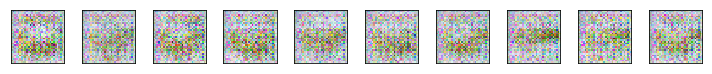

Epoch:  21/100 Discriminator Loss:  2.4039  Generator Loss:  4.3249
Epoch:  22/100 Discriminator Loss:  3.1896  Generator Loss:  4.7557
Epoch:  23/100 Discriminator Loss:  3.8224  Generator Loss:  2.4770
Epoch:  24/100 Discriminator Loss:  4.2152  Generator Loss:  2.7972
Epoch:  25/100 Discriminator Loss:  3.6908  Generator Loss:  3.3347


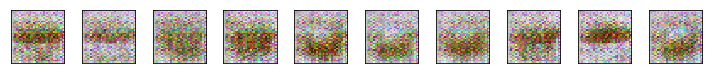

Epoch:  26/100 Discriminator Loss:  5.7420  Generator Loss:  4.0521
Epoch:  27/100 Discriminator Loss:  9.2213  Generator Loss:  4.8331
Epoch:  28/100 Discriminator Loss:  5.8578  Generator Loss:  4.2554
Epoch:  29/100 Discriminator Loss:  2.9719  Generator Loss:  3.1625
Epoch:  30/100 Discriminator Loss:  2.5450  Generator Loss:  1.8036


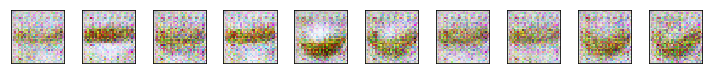

Epoch:  31/100 Discriminator Loss:  0.7618  Generator Loss:  1.2141
Epoch:  32/100 Discriminator Loss:  5.1192  Generator Loss:  4.0215
Epoch:  33/100 Discriminator Loss:  0.8665  Generator Loss:  1.0199
Epoch:  34/100 Discriminator Loss:  1.4103  Generator Loss:  1.5467
Epoch:  35/100 Discriminator Loss:  7.0228  Generator Loss:  5.6830


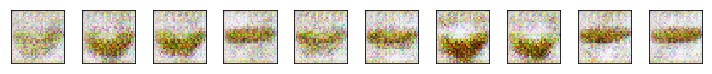

Epoch:  36/100 Discriminator Loss:  1.9864  Generator Loss:  1.3490
Epoch:  37/100 Discriminator Loss:  2.3519  Generator Loss:  1.2937
Epoch:  38/100 Discriminator Loss:  2.9014  Generator Loss:  3.6546
Epoch:  39/100 Discriminator Loss:  1.6890  Generator Loss:  2.5728
Epoch:  40/100 Discriminator Loss:  1.0777  Generator Loss:  1.6491


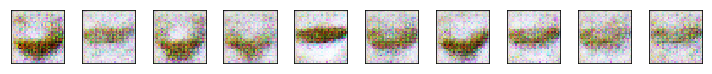

Epoch:  41/100 Discriminator Loss:  1.1254  Generator Loss:  1.8603
Epoch:  42/100 Discriminator Loss:  1.6288  Generator Loss:  2.5432
Epoch:  43/100 Discriminator Loss:  8.2382  Generator Loss: 11.2873
Epoch:  44/100 Discriminator Loss:  4.2975  Generator Loss:  4.0836
Epoch:  45/100 Discriminator Loss:  3.5807  Generator Loss:  4.1626


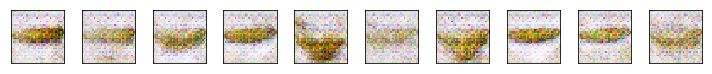

Epoch:  46/100 Discriminator Loss:  3.8822  Generator Loss:  4.9468
Epoch:  47/100 Discriminator Loss:  3.1008  Generator Loss:  3.6813
Epoch:  48/100 Discriminator Loss:  1.9970  Generator Loss:  1.2728
Epoch:  49/100 Discriminator Loss:  1.8529  Generator Loss:  3.3333
Epoch:  50/100 Discriminator Loss:  1.6386  Generator Loss:  2.6538


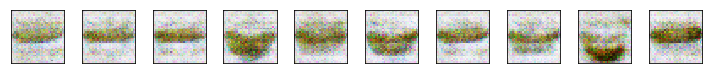

Epoch:  51/100 Discriminator Loss:  1.4795  Generator Loss:  2.0254
Epoch:  52/100 Discriminator Loss:  1.4870  Generator Loss:  3.1856
Epoch:  53/100 Discriminator Loss:  1.9125  Generator Loss:  2.6857
Epoch:  54/100 Discriminator Loss:  1.9597  Generator Loss:  1.5788
Epoch:  55/100 Discriminator Loss: 14.6685  Generator Loss: 11.1434


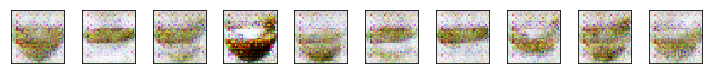

Epoch:  56/100 Discriminator Loss: 15.8714  Generator Loss: 11.8266
Epoch:  57/100 Discriminator Loss: 14.8672  Generator Loss: 10.3569
Epoch:  58/100 Discriminator Loss: 14.8844  Generator Loss: 11.9911
Epoch:  59/100 Discriminator Loss: 13.3520  Generator Loss: 12.5545
Epoch:  60/100 Discriminator Loss:  5.8844  Generator Loss:  4.9966


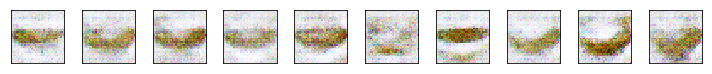

Epoch:  61/100 Discriminator Loss:  5.0067  Generator Loss:  4.3878
Epoch:  62/100 Discriminator Loss:  4.3359  Generator Loss:  3.6673
Epoch:  63/100 Discriminator Loss:  5.6247  Generator Loss:  4.8623
Epoch:  64/100 Discriminator Loss:  5.2379  Generator Loss:  3.9528
Epoch:  65/100 Discriminator Loss: 12.2581  Generator Loss: 11.7221


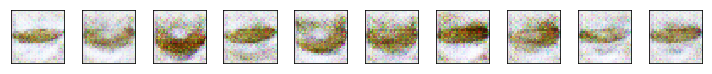

Epoch:  66/100 Discriminator Loss:  8.1325  Generator Loss:  7.1070
Epoch:  67/100 Discriminator Loss:  8.8444  Generator Loss:  6.8434
Epoch:  68/100 Discriminator Loss:  6.3202  Generator Loss:  5.0102
Epoch:  69/100 Discriminator Loss:  5.9003  Generator Loss:  5.6331
Epoch:  70/100 Discriminator Loss:  9.6241  Generator Loss:  8.8126


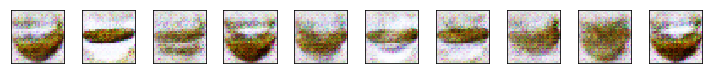

Epoch:  71/100 Discriminator Loss:  8.1246  Generator Loss:  7.5824
Epoch:  72/100 Discriminator Loss:  7.4289  Generator Loss:  6.9327
Epoch:  73/100 Discriminator Loss:  6.1376  Generator Loss:  5.1286
Epoch:  74/100 Discriminator Loss:  7.3413  Generator Loss:  4.4231
Epoch:  75/100 Discriminator Loss: 11.4166  Generator Loss:  5.7890


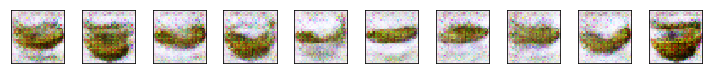

Epoch:  76/100 Discriminator Loss: 12.1390  Generator Loss:  8.2698
Epoch:  77/100 Discriminator Loss:  9.7885  Generator Loss:  6.7974
Epoch:  78/100 Discriminator Loss:  8.2591  Generator Loss:  5.8985
Epoch:  79/100 Discriminator Loss:  9.2729  Generator Loss:  6.5211
Epoch:  80/100 Discriminator Loss:  9.3030  Generator Loss:  6.5988


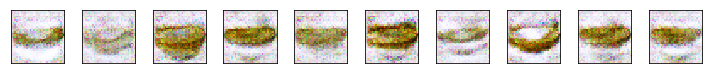

Epoch:  81/100 Discriminator Loss: 10.9952  Generator Loss:  6.5729
Epoch:  82/100 Discriminator Loss:  9.9603  Generator Loss:  6.0151
Epoch:  83/100 Discriminator Loss:  9.2106  Generator Loss:  5.8951
Epoch:  84/100 Discriminator Loss: 10.7059  Generator Loss:  7.4454
Epoch:  85/100 Discriminator Loss: 15.2115  Generator Loss: 15.2031


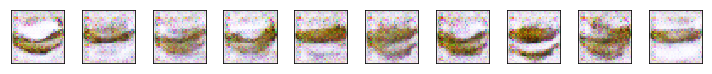

Epoch:  86/100 Discriminator Loss: 14.2086  Generator Loss: 12.8631
Epoch:  87/100 Discriminator Loss: 13.1751  Generator Loss:  9.4582
Epoch:  88/100 Discriminator Loss: 14.5911  Generator Loss: 11.0269
Epoch:  89/100 Discriminator Loss:  7.1794  Generator Loss:  6.2837
Epoch:  90/100 Discriminator Loss:  9.0871  Generator Loss:  6.3611


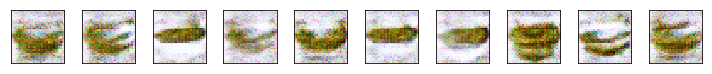

Epoch:  91/100 Discriminator Loss:  7.5290  Generator Loss:  4.0445
Epoch:  92/100 Discriminator Loss:  2.5959  Generator Loss:  4.2442
Epoch:  93/100 Discriminator Loss: 15.8102  Generator Loss: 14.0459
Epoch:  94/100 Discriminator Loss: 12.7377  Generator Loss:  6.9181
Epoch:  95/100 Discriminator Loss: 13.6113  Generator Loss:  7.5871


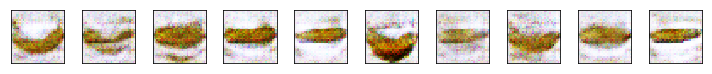

Epoch:  96/100 Discriminator Loss: 12.8136  Generator Loss:  7.9394
Epoch:  97/100 Discriminator Loss:  9.1694  Generator Loss:  4.7865
Epoch:  98/100 Discriminator Loss:  9.0957  Generator Loss:  5.4186
Epoch:  99/100 Discriminator Loss:  9.3584  Generator Loss:  4.7460
Epoch: 100/100 Discriminator Loss: 15.5198  Generator Loss: 14.2597


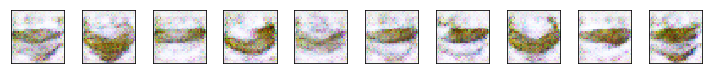

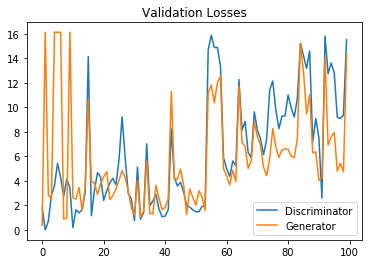

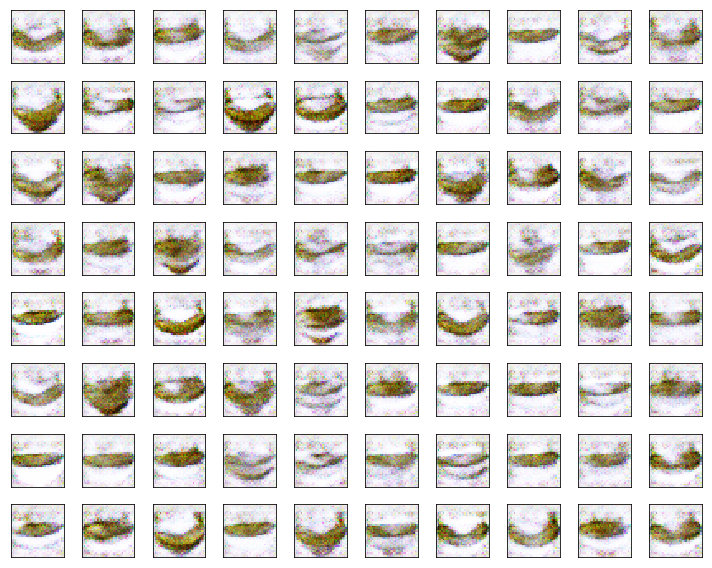

In [0]:
train(g_learning_rate=0.0001, g_beta_1=0.4, d_learning_rate=0.001, d_beta_1=0.4, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  0.5231  Generator Loss:  1.7868
Epoch:   2/100 Discriminator Loss:  8.7915  Generator Loss:  3.7041
Epoch:   3/100 Discriminator Loss:  0.0002  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss:  3.9471  Generator Loss: 16.1181
Epoch:   5/100 Discriminator Loss:  3.1922  Generator Loss: 16.1181


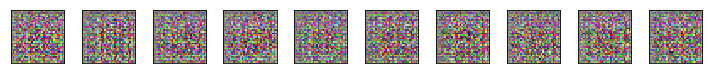

Epoch:   6/100 Discriminator Loss: 15.2286  Generator Loss: 16.1181
Epoch:   7/100 Discriminator Loss:  2.0720  Generator Loss: 16.1181
Epoch:   8/100 Discriminator Loss:  1.6755  Generator Loss: 16.1181
Epoch:   9/100 Discriminator Loss: 13.0874  Generator Loss: 16.1181
Epoch:  10/100 Discriminator Loss:  1.6984  Generator Loss: 16.1181


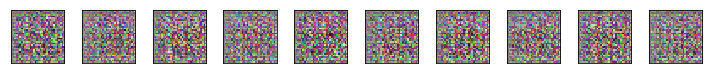

Epoch:  11/100 Discriminator Loss:  2.2002  Generator Loss: 16.1181
Epoch:  12/100 Discriminator Loss:  7.1141  Generator Loss: 16.1181
Epoch:  13/100 Discriminator Loss: 15.0296  Generator Loss: 16.1181
Epoch:  14/100 Discriminator Loss:  1.4803  Generator Loss: 16.1181
Epoch:  15/100 Discriminator Loss: 11.5453  Generator Loss: 16.1181


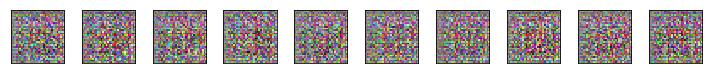

Epoch:  16/100 Discriminator Loss:  1.7480  Generator Loss: 16.1181
Epoch:  17/100 Discriminator Loss: 15.0451  Generator Loss: 16.1181
Epoch:  18/100 Discriminator Loss:  9.9894  Generator Loss: 16.1181
Epoch:  19/100 Discriminator Loss: 14.1937  Generator Loss: 16.1181
Epoch:  20/100 Discriminator Loss:  2.2614  Generator Loss: 16.1181


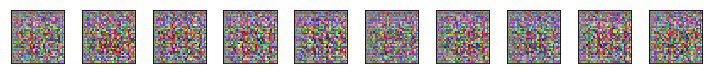

Epoch:  21/100 Discriminator Loss: 13.8258  Generator Loss: 16.1181
Epoch:  22/100 Discriminator Loss:  1.7700  Generator Loss: 16.1181
Epoch:  23/100 Discriminator Loss:  6.4276  Generator Loss: 16.1181
Epoch:  24/100 Discriminator Loss: 12.3000  Generator Loss: 16.1181


KeyboardInterrupt: ignored

In [0]:
train(g_learning_rate=0.0001, g_beta_1=0.4, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  2.2894  Generator Loss: 16.1181
Epoch:   2/100 Discriminator Loss:  0.0000  Generator Loss: 13.8959
Epoch:   3/100 Discriminator Loss:  4.9643  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   5/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181


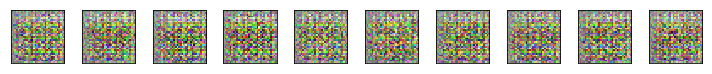

Epoch:   6/100 Discriminator Loss: 18.0116  Generator Loss:  0.0832
Epoch:   7/100 Discriminator Loss:  7.9445  Generator Loss:  1.4443
Epoch:   8/100 Discriminator Loss:  7.3214  Generator Loss:  7.7837
Epoch:   9/100 Discriminator Loss:  2.0845  Generator Loss:  0.6624
Epoch:  10/100 Discriminator Loss:  2.3245  Generator Loss:  0.9017


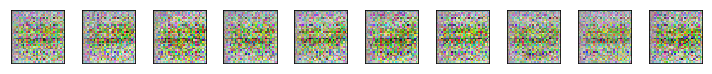

Epoch:  11/100 Discriminator Loss:  5.1765  Generator Loss:  1.3686
Epoch:  12/100 Discriminator Loss:  5.0311  Generator Loss:  0.3298
Epoch:  13/100 Discriminator Loss:  9.4647  Generator Loss:  6.5504
Epoch:  14/100 Discriminator Loss:  8.0635  Generator Loss:  4.1154
Epoch:  15/100 Discriminator Loss:  2.5255  Generator Loss:  1.5740


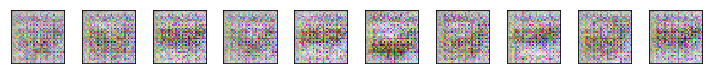

Epoch:  16/100 Discriminator Loss:  5.9705  Generator Loss:  2.1242
Epoch:  17/100 Discriminator Loss:  9.8203  Generator Loss:  7.6975
Epoch:  18/100 Discriminator Loss:  3.9979  Generator Loss:  2.4587
Epoch:  19/100 Discriminator Loss:  1.7065  Generator Loss:  2.4383
Epoch:  20/100 Discriminator Loss:  2.2776  Generator Loss:  0.5674


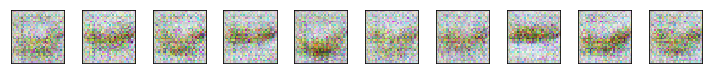

Epoch:  21/100 Discriminator Loss:  2.3233  Generator Loss:  0.2864
Epoch:  22/100 Discriminator Loss: 11.6255  Generator Loss:  6.8851
Epoch:  23/100 Discriminator Loss: 15.1920  Generator Loss: 16.0822
Epoch:  24/100 Discriminator Loss:  4.6051  Generator Loss:  3.7021
Epoch:  25/100 Discriminator Loss:  4.0898  Generator Loss:  4.7756


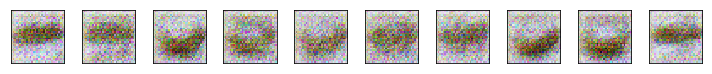

Epoch:  26/100 Discriminator Loss: 10.2470  Generator Loss:  8.8973
Epoch:  27/100 Discriminator Loss:  1.1036  Generator Loss:  1.4702
Epoch:  28/100 Discriminator Loss:  8.3703  Generator Loss:  6.1113
Epoch:  29/100 Discriminator Loss:  3.8100  Generator Loss:  3.2946
Epoch:  30/100 Discriminator Loss:  4.6989  Generator Loss:  1.9303


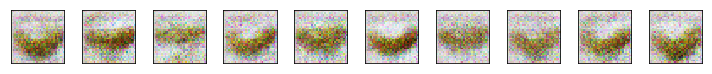

Epoch:  31/100 Discriminator Loss:  3.1192  Generator Loss:  2.5860
Epoch:  32/100 Discriminator Loss:  5.0679  Generator Loss:  3.4980
Epoch:  33/100 Discriminator Loss:  1.2300  Generator Loss:  1.3110
Epoch:  34/100 Discriminator Loss:  1.5080  Generator Loss:  0.6815
Epoch:  35/100 Discriminator Loss:  1.8890  Generator Loss:  1.8988


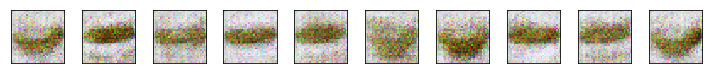

Epoch:  36/100 Discriminator Loss:  1.3832  Generator Loss:  2.2399
Epoch:  37/100 Discriminator Loss:  1.1973  Generator Loss:  1.6594
Epoch:  38/100 Discriminator Loss:  3.3137  Generator Loss:  3.2852
Epoch:  39/100 Discriminator Loss:  1.1374  Generator Loss:  1.6152
Epoch:  40/100 Discriminator Loss:  3.0486  Generator Loss:  3.5128


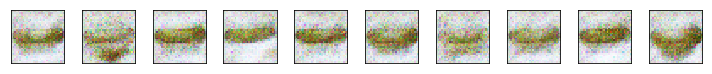

Epoch:  41/100 Discriminator Loss:  1.5037  Generator Loss:  2.4659
Epoch:  42/100 Discriminator Loss:  2.1524  Generator Loss:  2.5886
Epoch:  43/100 Discriminator Loss:  3.0255  Generator Loss:  5.0214
Epoch:  44/100 Discriminator Loss:  2.9296  Generator Loss:  3.5580
Epoch:  45/100 Discriminator Loss:  2.4664  Generator Loss:  1.4296


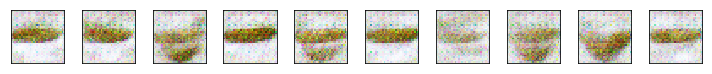

Epoch:  46/100 Discriminator Loss:  4.9910  Generator Loss:  4.2292
Epoch:  47/100 Discriminator Loss:  2.7429  Generator Loss:  2.7407
Epoch:  48/100 Discriminator Loss:  2.5663  Generator Loss:  2.1460
Epoch:  49/100 Discriminator Loss:  2.9748  Generator Loss:  1.8470
Epoch:  50/100 Discriminator Loss: 16.1181  Generator Loss: 15.5152


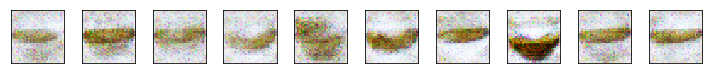

Epoch:  51/100 Discriminator Loss: 11.2664  Generator Loss:  7.3368
Epoch:  52/100 Discriminator Loss:  6.5563  Generator Loss:  6.1865
Epoch:  53/100 Discriminator Loss:  4.0792  Generator Loss:  3.8203
Epoch:  54/100 Discriminator Loss:  3.3654  Generator Loss:  2.4681
Epoch:  55/100 Discriminator Loss:  7.2984  Generator Loss:  6.2241


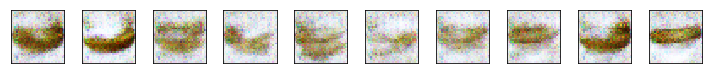

Epoch:  56/100 Discriminator Loss:  3.3356  Generator Loss:  5.1004
Epoch:  57/100 Discriminator Loss:  6.4934  Generator Loss:  5.3947
Epoch:  58/100 Discriminator Loss:  5.7682  Generator Loss:  4.5316
Epoch:  59/100 Discriminator Loss:  6.3799  Generator Loss:  4.9799
Epoch:  60/100 Discriminator Loss:  4.8114  Generator Loss:  3.2380


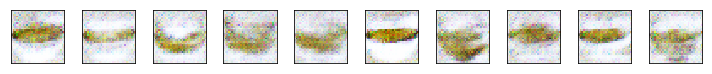

Epoch:  61/100 Discriminator Loss:  5.1312  Generator Loss:  3.0571
Epoch:  62/100 Discriminator Loss:  7.7756  Generator Loss:  4.3795
Epoch:  63/100 Discriminator Loss:  5.4901  Generator Loss:  3.1041
Epoch:  64/100 Discriminator Loss: 15.6601  Generator Loss: 15.1594
Epoch:  65/100 Discriminator Loss: 15.6600  Generator Loss: 14.8716


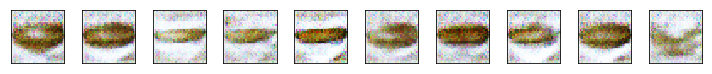

Epoch:  66/100 Discriminator Loss: 14.3677  Generator Loss:  9.7417
Epoch:  67/100 Discriminator Loss: 15.9383  Generator Loss: 15.2991
Epoch:  68/100 Discriminator Loss:  6.7557  Generator Loss:  8.0999
Epoch:  69/100 Discriminator Loss: 11.5051  Generator Loss:  8.7226
Epoch:  70/100 Discriminator Loss:  8.4829  Generator Loss:  4.7837


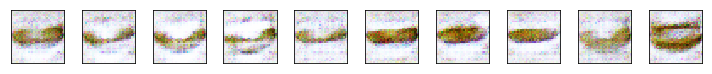

Epoch:  71/100 Discriminator Loss:  6.7705  Generator Loss:  3.5386
Epoch:  72/100 Discriminator Loss:  7.3283  Generator Loss:  3.0817
Epoch:  73/100 Discriminator Loss:  8.6421  Generator Loss:  3.0026
Epoch:  74/100 Discriminator Loss:  3.1355  Generator Loss:  5.9215
Epoch:  75/100 Discriminator Loss: 15.8430  Generator Loss: 15.6313


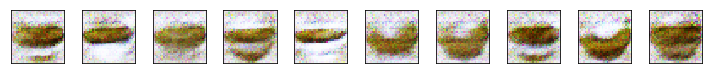

Epoch:  76/100 Discriminator Loss: 15.5328  Generator Loss: 13.0203
Epoch:  77/100 Discriminator Loss: 13.4957  Generator Loss: 10.8941
Epoch:  78/100 Discriminator Loss: 14.7190  Generator Loss: 12.2700
Epoch:  79/100 Discriminator Loss: 12.2731  Generator Loss:  9.1911
Epoch:  80/100 Discriminator Loss: 11.5162  Generator Loss:  7.2066


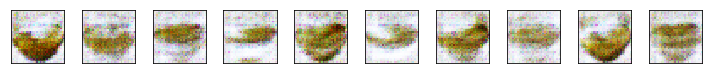

Epoch:  81/100 Discriminator Loss: 10.5392  Generator Loss:  5.9895
Epoch:  82/100 Discriminator Loss: 12.3409  Generator Loss:  6.6141
Epoch:  83/100 Discriminator Loss: 11.6815  Generator Loss:  6.8114
Epoch:  84/100 Discriminator Loss: 11.1860  Generator Loss:  5.7585
Epoch:  85/100 Discriminator Loss: 10.9796  Generator Loss:  5.6929


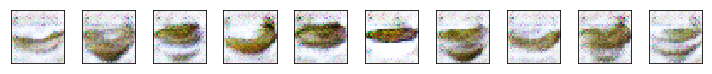

Epoch:  86/100 Discriminator Loss: 11.7636  Generator Loss:  5.2682
Epoch:  87/100 Discriminator Loss:  4.4654  Generator Loss:  3.8628
Epoch:  88/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  89/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  90/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181


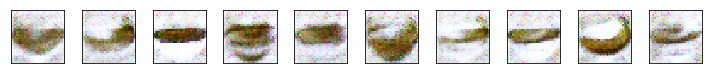

Epoch:  91/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  92/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  93/100 Discriminator Loss: 15.5371  Generator Loss: 14.7252
Epoch:  94/100 Discriminator Loss: 14.3448  Generator Loss: 10.1759
Epoch:  95/100 Discriminator Loss: 13.3011  Generator Loss:  9.9480


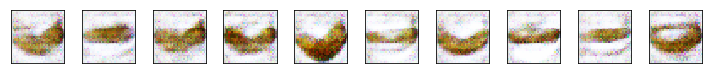

Epoch:  96/100 Discriminator Loss:  8.7191  Generator Loss:  6.6983
Epoch:  97/100 Discriminator Loss: 10.3610  Generator Loss:  7.0981
Epoch:  98/100 Discriminator Loss:  9.0881  Generator Loss:  6.9972
Epoch:  99/100 Discriminator Loss:  9.0441  Generator Loss:  6.6167
Epoch: 100/100 Discriminator Loss:  5.7462  Generator Loss:  4.2620


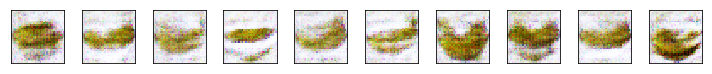

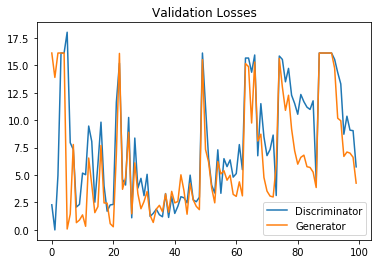

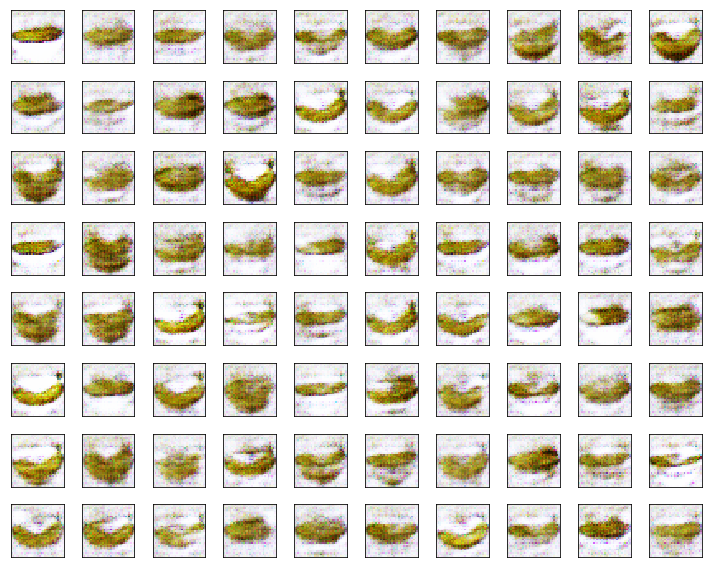

In [0]:
train(g_learning_rate=0.0001, g_beta_1=0.3, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  7.2126  Generator Loss:  2.6235
Epoch:   2/100 Discriminator Loss:  5.7914  Generator Loss: 16.1181
Epoch:   3/100 Discriminator Loss:  0.0000  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss:  0.0021  Generator Loss: 10.1524
Epoch:   5/100 Discriminator Loss:  0.0060  Generator Loss: 16.1181


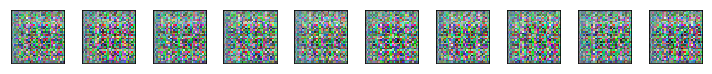

Epoch:   6/100 Discriminator Loss:  4.8566  Generator Loss:  3.2582
Epoch:   7/100 Discriminator Loss:  5.7753  Generator Loss: 16.1181
Epoch:   8/100 Discriminator Loss:  5.2967  Generator Loss:  7.1337
Epoch:   9/100 Discriminator Loss:  3.2217  Generator Loss:  7.7130
Epoch:  10/100 Discriminator Loss:  2.6946  Generator Loss: 16.1181


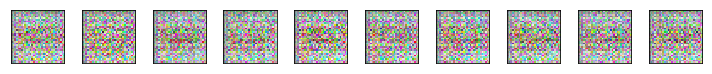

Epoch:  11/100 Discriminator Loss:  1.0384  Generator Loss:  6.2162
Epoch:  12/100 Discriminator Loss:  6.9018  Generator Loss: 16.1181
Epoch:  13/100 Discriminator Loss:  0.0105  Generator Loss: 11.9138
Epoch:  14/100 Discriminator Loss:  0.4486  Generator Loss:  2.1235
Epoch:  15/100 Discriminator Loss:  1.1738  Generator Loss:  1.0319


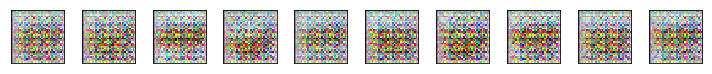

Epoch:  16/100 Discriminator Loss:  2.4098  Generator Loss:  0.1672
Epoch:  17/100 Discriminator Loss:  1.8943  Generator Loss:  2.0155
Epoch:  18/100 Discriminator Loss: 11.6177  Generator Loss: 13.1285
Epoch:  19/100 Discriminator Loss:  2.7057  Generator Loss:  4.7116
Epoch:  20/100 Discriminator Loss:  0.2004  Generator Loss:  2.8025


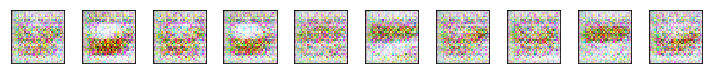

Epoch:  21/100 Discriminator Loss:  3.5591  Generator Loss: 15.4282
Epoch:  22/100 Discriminator Loss:  0.6850  Generator Loss:  4.5229
Epoch:  23/100 Discriminator Loss:  0.4895  Generator Loss:  1.4464
Epoch:  24/100 Discriminator Loss:  1.0047  Generator Loss:  0.9716
Epoch:  25/100 Discriminator Loss:  1.1703  Generator Loss:  1.0600


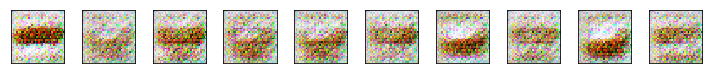

Epoch:  26/100 Discriminator Loss:  1.6792  Generator Loss:  1.3186
Epoch:  27/100 Discriminator Loss:  0.7688  Generator Loss:  1.1164
Epoch:  28/100 Discriminator Loss:  3.1480  Generator Loss:  4.7085
Epoch:  29/100 Discriminator Loss:  1.2862  Generator Loss:  3.2107
Epoch:  30/100 Discriminator Loss:  3.0716  Generator Loss:  0.4038


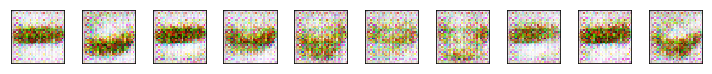

Epoch:  31/100 Discriminator Loss:  0.1341  Generator Loss:  5.2624
Epoch:  32/100 Discriminator Loss:  0.2669  Generator Loss:  6.5968
Epoch:  33/100 Discriminator Loss:  0.3729  Generator Loss:  4.4731
Epoch:  34/100 Discriminator Loss:  0.5620  Generator Loss:  2.4214
Epoch:  35/100 Discriminator Loss:  0.9003  Generator Loss:  1.3746


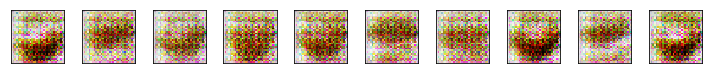

Epoch:  36/100 Discriminator Loss:  1.2795  Generator Loss:  1.2681
Epoch:  37/100 Discriminator Loss:  5.8678  Generator Loss:  7.5440
Epoch:  38/100 Discriminator Loss:  2.5075  Generator Loss:  5.1658
Epoch:  39/100 Discriminator Loss:  0.6866  Generator Loss:  1.2993
Epoch:  40/100 Discriminator Loss:  0.5209  Generator Loss:  2.0927


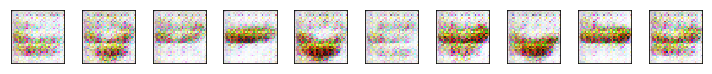

Epoch:  41/100 Discriminator Loss:  1.0596  Generator Loss:  0.7630
Epoch:  42/100 Discriminator Loss:  1.0183  Generator Loss:  0.8011
Epoch:  43/100 Discriminator Loss:  1.6440  Generator Loss:  3.5150
Epoch:  44/100 Discriminator Loss:  5.8109  Generator Loss:  6.0973
Epoch:  45/100 Discriminator Loss: 12.1932  Generator Loss: 12.5619


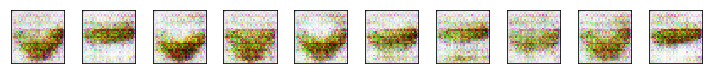

Epoch:  46/100 Discriminator Loss:  2.4249  Generator Loss:  5.0858
Epoch:  47/100 Discriminator Loss:  1.0135  Generator Loss:  0.9637
Epoch:  48/100 Discriminator Loss:  1.4833  Generator Loss:  5.3710
Epoch:  49/100 Discriminator Loss:  2.3730  Generator Loss:  6.2695
Epoch:  50/100 Discriminator Loss:  3.1634  Generator Loss:  4.9888


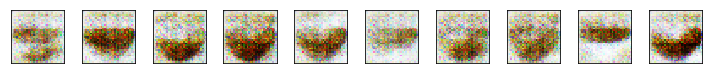

Epoch:  51/100 Discriminator Loss:  5.3868  Generator Loss:  6.8210
Epoch:  52/100 Discriminator Loss:  2.3163  Generator Loss:  5.3708
Epoch:  53/100 Discriminator Loss:  2.0363  Generator Loss:  4.4278
Epoch:  54/100 Discriminator Loss:  2.1075  Generator Loss:  2.8267
Epoch:  55/100 Discriminator Loss:  1.7138  Generator Loss:  2.2188


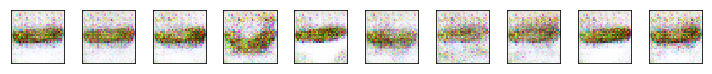

Epoch:  56/100 Discriminator Loss:  3.7191  Generator Loss:  3.8685
Epoch:  57/100 Discriminator Loss: 10.3180  Generator Loss: 14.2344
Epoch:  58/100 Discriminator Loss:  2.0380  Generator Loss:  5.0789
Epoch:  59/100 Discriminator Loss:  3.1703  Generator Loss:  3.9730
Epoch:  60/100 Discriminator Loss:  3.5165  Generator Loss:  4.5519


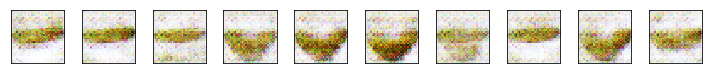

Epoch:  61/100 Discriminator Loss:  2.2193  Generator Loss:  3.1797
Epoch:  62/100 Discriminator Loss:  2.7203  Generator Loss:  3.1505
Epoch:  63/100 Discriminator Loss:  1.7241  Generator Loss:  3.2567
Epoch:  64/100 Discriminator Loss:  1.9832  Generator Loss:  4.2840
Epoch:  65/100 Discriminator Loss:  4.3423  Generator Loss:  5.7208


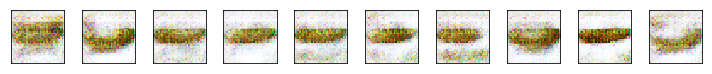

Epoch:  66/100 Discriminator Loss:  1.5013  Generator Loss:  2.9696
Epoch:  67/100 Discriminator Loss:  2.4011  Generator Loss:  3.2854
Epoch:  68/100 Discriminator Loss:  2.0227  Generator Loss:  2.6785
Epoch:  69/100 Discriminator Loss:  7.2366  Generator Loss: 10.3314
Epoch:  70/100 Discriminator Loss:  5.5238  Generator Loss:  7.0139


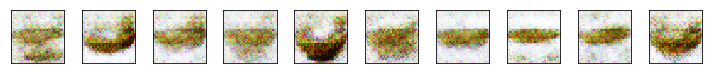

Epoch:  71/100 Discriminator Loss:  3.5227  Generator Loss:  4.8261
Epoch:  72/100 Discriminator Loss:  5.0663  Generator Loss:  5.1020
Epoch:  73/100 Discriminator Loss:  1.8504  Generator Loss:  3.3024
Epoch:  74/100 Discriminator Loss:  4.1422  Generator Loss:  3.9863
Epoch:  75/100 Discriminator Loss:  7.8953  Generator Loss: 10.4720


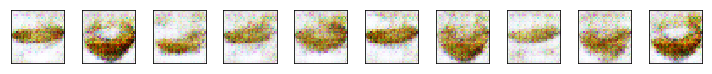

Epoch:  76/100 Discriminator Loss:  7.4711  Generator Loss:  7.1462
Epoch:  77/100 Discriminator Loss:  4.8619  Generator Loss:  3.1806
Epoch:  78/100 Discriminator Loss:  4.0388  Generator Loss:  2.6678
Epoch:  79/100 Discriminator Loss:  4.3273  Generator Loss:  2.7827
Epoch:  80/100 Discriminator Loss:  2.4359  Generator Loss:  3.5772


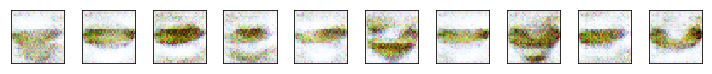

Epoch:  81/100 Discriminator Loss:  4.0653  Generator Loss:  3.6922
Epoch:  82/100 Discriminator Loss:  3.3478  Generator Loss:  4.9304
Epoch:  83/100 Discriminator Loss:  5.4673  Generator Loss:  5.2187
Epoch:  84/100 Discriminator Loss: 15.9841  Generator Loss: 15.8339
Epoch:  85/100 Discriminator Loss:  3.0405  Generator Loss:  4.7282


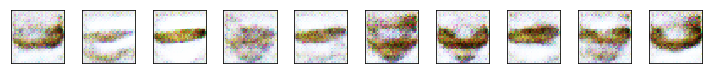

Epoch:  86/100 Discriminator Loss:  3.8965  Generator Loss:  3.3509
Epoch:  87/100 Discriminator Loss:  3.1245  Generator Loss:  3.8674
Epoch:  88/100 Discriminator Loss:  3.0825  Generator Loss:  3.4330
Epoch:  89/100 Discriminator Loss:  2.4436  Generator Loss:  4.3202
Epoch:  90/100 Discriminator Loss:  1.3892  Generator Loss:  4.2374


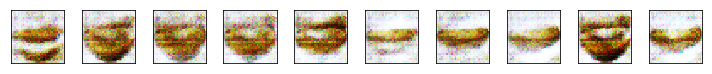

Epoch:  91/100 Discriminator Loss:  2.1423  Generator Loss:  3.3940
Epoch:  92/100 Discriminator Loss:  1.9796  Generator Loss:  3.0012
Epoch:  93/100 Discriminator Loss:  3.7358  Generator Loss:  3.6316
Epoch:  94/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  95/100 Discriminator Loss:  9.8025  Generator Loss: 10.0030


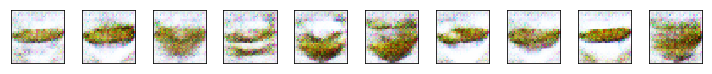

Epoch:  96/100 Discriminator Loss:  9.2313  Generator Loss:  9.4526
Epoch:  97/100 Discriminator Loss:  8.8241  Generator Loss:  7.3540
Epoch:  98/100 Discriminator Loss:  7.5340  Generator Loss:  6.3980
Epoch:  99/100 Discriminator Loss:  6.5548  Generator Loss:  6.2403
Epoch: 100/100 Discriminator Loss:  7.1155  Generator Loss:  7.8358


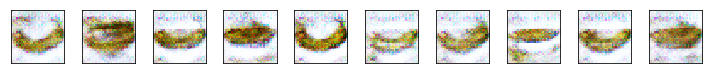

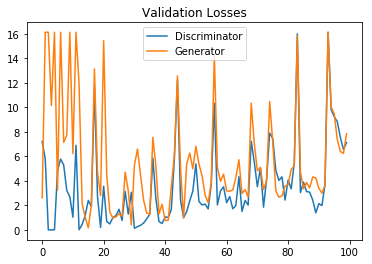

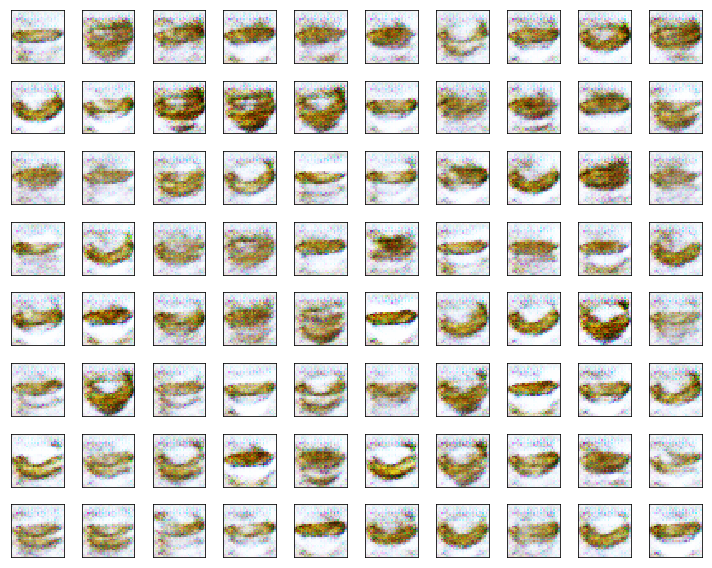

In [0]:
train(g_learning_rate=0.0001, g_beta_1=0.6, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  0.0004  Generator Loss: 11.8759
Epoch:   2/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   3/100 Discriminator Loss:  5.0369  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   5/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181


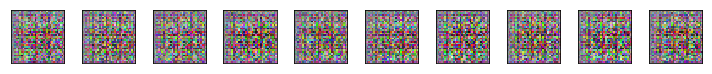

Epoch:   6/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   7/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   8/100 Discriminator Loss: 16.9447  Generator Loss:  1.7446
Epoch:   9/100 Discriminator Loss: 16.0868  Generator Loss:  6.8111
Epoch:  10/100 Discriminator Loss:  3.8975  Generator Loss:  5.7148


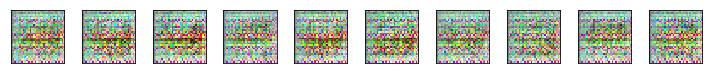

Epoch:  11/100 Discriminator Loss:  4.7368  Generator Loss:  2.5803
Epoch:  12/100 Discriminator Loss: 10.5198  Generator Loss:  3.5165
Epoch:  13/100 Discriminator Loss:  5.0880  Generator Loss:  3.7716
Epoch:  14/100 Discriminator Loss:  5.0423  Generator Loss:  2.5651
Epoch:  15/100 Discriminator Loss:  3.8846  Generator Loss:  1.5936


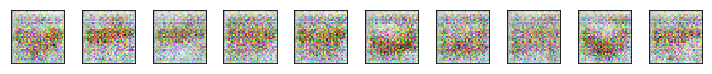

Epoch:  16/100 Discriminator Loss: 14.6980  Generator Loss: 15.0405
Epoch:  17/100 Discriminator Loss: 10.2123  Generator Loss:  6.0353
Epoch:  18/100 Discriminator Loss:  6.1960  Generator Loss:  4.9724
Epoch:  19/100 Discriminator Loss:  3.0151  Generator Loss:  2.0643
Epoch:  20/100 Discriminator Loss:  3.2401  Generator Loss:  2.1557


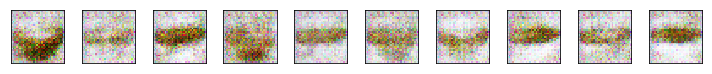

Epoch:  21/100 Discriminator Loss:  3.3107  Generator Loss:  1.8651
Epoch:  22/100 Discriminator Loss:  2.7647  Generator Loss:  1.1621
Epoch:  23/100 Discriminator Loss:  4.1791  Generator Loss:  3.4941
Epoch:  24/100 Discriminator Loss:  3.1107  Generator Loss:  2.7171
Epoch:  25/100 Discriminator Loss:  3.0303  Generator Loss:  1.3356


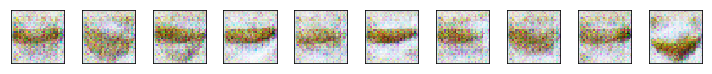

Epoch:  26/100 Discriminator Loss:  4.3022  Generator Loss:  2.3548
Epoch:  27/100 Discriminator Loss:  8.2277  Generator Loss:  5.4627
Epoch:  28/100 Discriminator Loss:  8.4597  Generator Loss:  5.4452
Epoch:  29/100 Discriminator Loss:  5.9472  Generator Loss:  3.9661
Epoch:  30/100 Discriminator Loss:  5.4909  Generator Loss:  3.8254


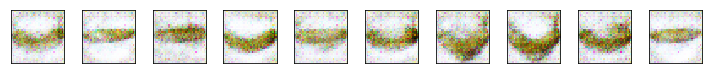

Epoch:  31/100 Discriminator Loss:  5.6747  Generator Loss:  5.1649
Epoch:  32/100 Discriminator Loss:  6.0311  Generator Loss:  5.4721
Epoch:  33/100 Discriminator Loss:  5.8786  Generator Loss:  3.9315
Epoch:  34/100 Discriminator Loss:  8.9200  Generator Loss:  7.6368
Epoch:  35/100 Discriminator Loss: 10.1058  Generator Loss:  7.5437


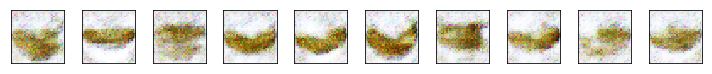

Epoch:  36/100 Discriminator Loss: 10.2647  Generator Loss:  7.7780
Epoch:  37/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  38/100 Discriminator Loss: 14.2504  Generator Loss: 10.2608
Epoch:  39/100 Discriminator Loss:  8.9751  Generator Loss:  6.9034
Epoch:  40/100 Discriminator Loss:  7.4510  Generator Loss:  5.4972


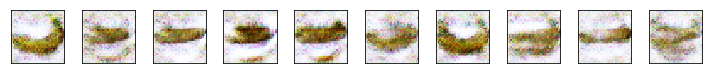

Epoch:  41/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  42/100 Discriminator Loss: 13.1464  Generator Loss:  9.2266
Epoch:  43/100 Discriminator Loss:  8.5655  Generator Loss:  7.5120
Epoch:  44/100 Discriminator Loss:  7.4355  Generator Loss:  5.9531
Epoch:  45/100 Discriminator Loss:  9.5866  Generator Loss:  5.8952


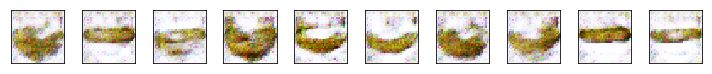

Epoch:  46/100 Discriminator Loss: 15.0786  Generator Loss: 14.0940
Epoch:  47/100 Discriminator Loss: 12.6824  Generator Loss:  7.7032
Epoch:  48/100 Discriminator Loss: 10.1543  Generator Loss:  6.1007
Epoch:  49/100 Discriminator Loss: 10.5333  Generator Loss:  5.1671
Epoch:  50/100 Discriminator Loss:  9.6071  Generator Loss:  4.5800


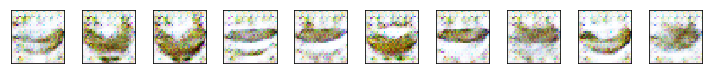

Epoch:  51/100 Discriminator Loss:  9.6097  Generator Loss:  4.4772
Epoch:  52/100 Discriminator Loss:  9.9474  Generator Loss:  5.3491
Epoch:  53/100 Discriminator Loss: 15.1499  Generator Loss: 10.2784
Epoch:  54/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  55/100 Discriminator Loss: 15.6749  Generator Loss: 12.7913


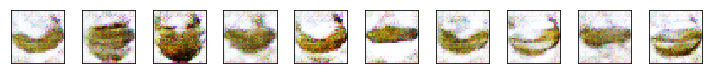

Epoch:  56/100 Discriminator Loss: 12.6276  Generator Loss:  7.5848
Epoch:  57/100 Discriminator Loss: 13.0853  Generator Loss:  8.1569
Epoch:  58/100 Discriminator Loss: 15.2724  Generator Loss: 10.9928
Epoch:  59/100 Discriminator Loss: 14.1333  Generator Loss: 14.4922
Epoch:  60/100 Discriminator Loss:  9.7972  Generator Loss:  9.0472


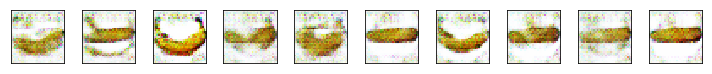

Epoch:  61/100 Discriminator Loss: 10.0885  Generator Loss:  7.3736
Epoch:  62/100 Discriminator Loss: 12.5580  Generator Loss:  7.7915
Epoch:  63/100 Discriminator Loss:  9.6953  Generator Loss:  6.3370
Epoch:  64/100 Discriminator Loss: 10.5035  Generator Loss:  4.7423
Epoch:  65/100 Discriminator Loss: 15.5389  Generator Loss: 12.5583


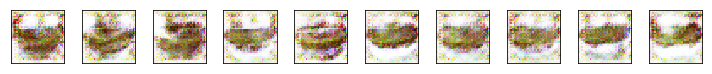

Epoch:  66/100 Discriminator Loss: 15.7881  Generator Loss:  9.2931
Epoch:  67/100 Discriminator Loss: 12.3460  Generator Loss:  7.2893
Epoch:  68/100 Discriminator Loss:  8.9585  Generator Loss:  6.8729
Epoch:  69/100 Discriminator Loss: 14.8887  Generator Loss: 14.9652
Epoch:  70/100 Discriminator Loss: 11.0802  Generator Loss:  8.6627


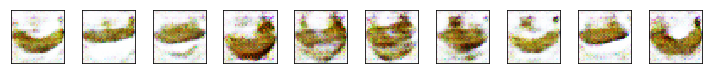

Epoch:  71/100 Discriminator Loss: 14.2075  Generator Loss: 11.2012
Epoch:  72/100 Discriminator Loss: 14.3027  Generator Loss: 10.5277
Epoch:  73/100 Discriminator Loss: 12.4712  Generator Loss:  8.3763
Epoch:  74/100 Discriminator Loss: 11.2205  Generator Loss:  5.4660
Epoch:  75/100 Discriminator Loss: 14.3497  Generator Loss: 12.4693


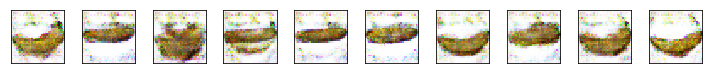

Epoch:  76/100 Discriminator Loss: 11.8352  Generator Loss:  8.3993
Epoch:  77/100 Discriminator Loss:  5.1755  Generator Loss:  5.7554
Epoch:  78/100 Discriminator Loss:  6.5292  Generator Loss:  4.3385
Epoch:  79/100 Discriminator Loss:  5.2944  Generator Loss:  2.8699
Epoch:  80/100 Discriminator Loss:  5.6450  Generator Loss:  2.2297


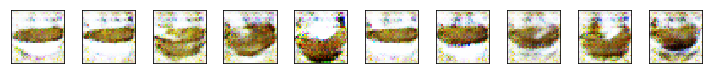

Epoch:  81/100 Discriminator Loss:  4.8007  Generator Loss:  2.2387
Epoch:  82/100 Discriminator Loss: 14.8960  Generator Loss:  7.7739
Epoch:  83/100 Discriminator Loss: 13.6644  Generator Loss:  7.6509
Epoch:  84/100 Discriminator Loss:  8.9145  Generator Loss:  6.2209
Epoch:  85/100 Discriminator Loss:  8.4846  Generator Loss:  3.7857


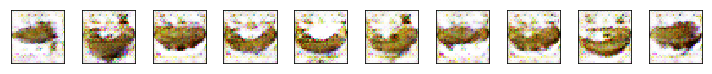

Epoch:  86/100 Discriminator Loss:  7.2390  Generator Loss:  3.3085
Epoch:  87/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  88/100 Discriminator Loss: 15.4847  Generator Loss: 12.3929
Epoch:  89/100 Discriminator Loss: 15.7281  Generator Loss:  7.6909
Epoch:  90/100 Discriminator Loss: 11.9780  Generator Loss:  6.0268


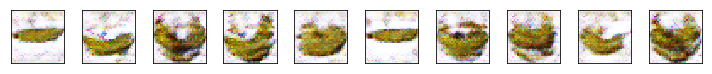

Epoch:  91/100 Discriminator Loss: 14.1190  Generator Loss: 10.2639
Epoch:  92/100 Discriminator Loss:  9.0251  Generator Loss:  5.3948
Epoch:  93/100 Discriminator Loss:  4.3588  Generator Loss:  2.7762
Epoch:  94/100 Discriminator Loss:  6.4191  Generator Loss:  5.7969
Epoch:  95/100 Discriminator Loss: 10.4747  Generator Loss:  8.2532


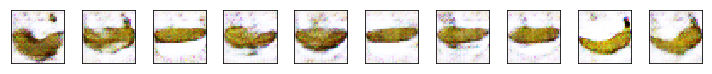

Epoch:  96/100 Discriminator Loss:  7.9708  Generator Loss:  5.6344
Epoch:  97/100 Discriminator Loss:  5.0989  Generator Loss:  3.9102
Epoch:  98/100 Discriminator Loss:  6.9847  Generator Loss:  4.6543
Epoch:  99/100 Discriminator Loss: 15.1487  Generator Loss: 12.4541
Epoch: 100/100 Discriminator Loss:  9.8586  Generator Loss:  7.0416


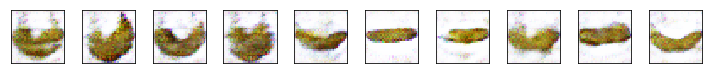

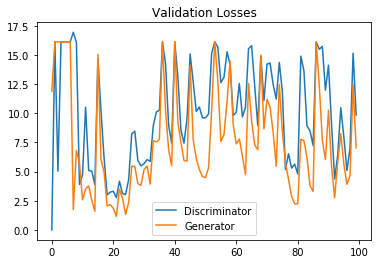

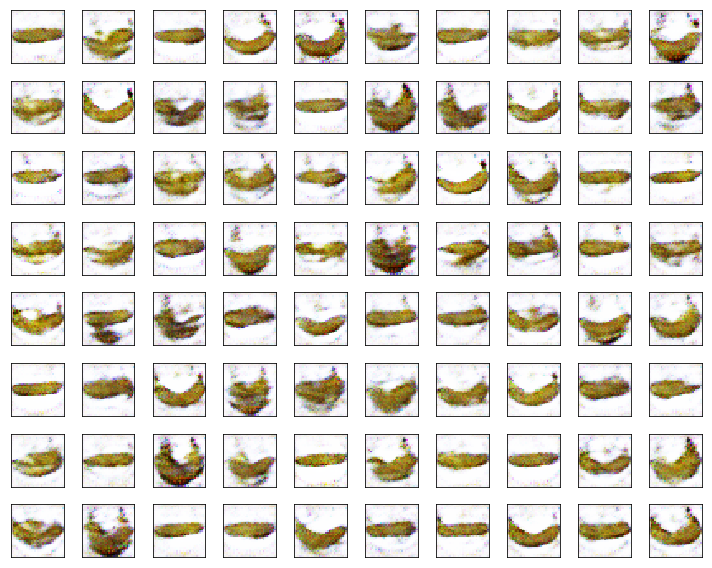

In [0]:
#Batch size of 64
train(g_learning_rate=0.0001, g_beta_1=0.3, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  7.4478  Generator Loss:  0.2358
Epoch:   2/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   3/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   5/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181


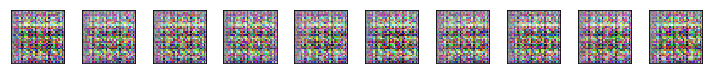

Epoch:   6/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   7/100 Discriminator Loss: 10.9830  Generator Loss:  1.5332
Epoch:   8/100 Discriminator Loss:  3.1483  Generator Loss:  2.5414
Epoch:   9/100 Discriminator Loss:  4.6863  Generator Loss:  1.7499
Epoch:  10/100 Discriminator Loss:  9.7759  Generator Loss: 11.0779


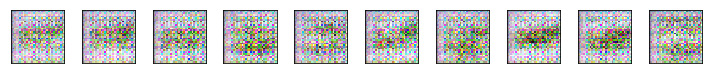

Epoch:  11/100 Discriminator Loss:  2.7499  Generator Loss:  4.3212
Epoch:  12/100 Discriminator Loss: 11.7701  Generator Loss:  8.2543
Epoch:  13/100 Discriminator Loss:  4.7201  Generator Loss:  1.5273
Epoch:  14/100 Discriminator Loss:  8.5407  Generator Loss:  3.7618
Epoch:  15/100 Discriminator Loss:  5.7987  Generator Loss:  3.5285


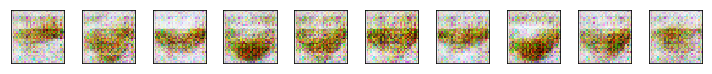

Epoch:  16/100 Discriminator Loss:  5.9993  Generator Loss:  3.5537
Epoch:  17/100 Discriminator Loss:  2.4092  Generator Loss:  1.4298
Epoch:  18/100 Discriminator Loss:  1.9279  Generator Loss:  1.3015
Epoch:  19/100 Discriminator Loss:  3.2995  Generator Loss:  1.8062
Epoch:  20/100 Discriminator Loss:  8.1328  Generator Loss:  7.3961


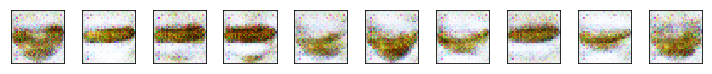

Epoch:  21/100 Discriminator Loss:  5.2162  Generator Loss:  4.0421
Epoch:  22/100 Discriminator Loss:  6.1406  Generator Loss:  5.1868
Epoch:  23/100 Discriminator Loss:  7.6547  Generator Loss:  4.7180
Epoch:  24/100 Discriminator Loss:  7.3153  Generator Loss:  6.2355
Epoch:  25/100 Discriminator Loss:  7.2519  Generator Loss:  4.0155


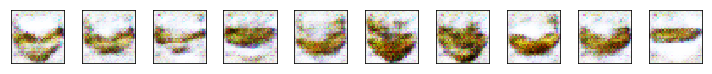

Epoch:  26/100 Discriminator Loss:  4.5660  Generator Loss:  3.0885
Epoch:  27/100 Discriminator Loss: 13.9057  Generator Loss: 12.7617
Epoch:  28/100 Discriminator Loss: 10.7687  Generator Loss:  8.0108
Epoch:  29/100 Discriminator Loss: 10.4390  Generator Loss:  7.4353
Epoch:  30/100 Discriminator Loss: 11.4417  Generator Loss: 10.3110


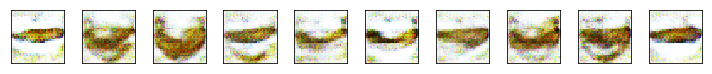

Epoch:  31/100 Discriminator Loss:  9.6578  Generator Loss:  5.3342
Epoch:  32/100 Discriminator Loss:  9.8874  Generator Loss:  8.9960
Epoch:  33/100 Discriminator Loss:  4.4144  Generator Loss:  3.1249
Epoch:  34/100 Discriminator Loss:  4.4017  Generator Loss:  3.0294
Epoch:  35/100 Discriminator Loss:  9.2881  Generator Loss:  8.7150


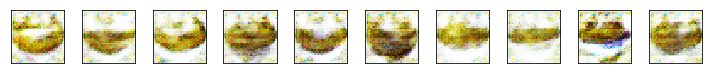

Epoch:  36/100 Discriminator Loss:  9.4564  Generator Loss:  5.1528
Epoch:  37/100 Discriminator Loss: 14.0666  Generator Loss:  9.9940
Epoch:  38/100 Discriminator Loss:  8.9846  Generator Loss:  5.1818
Epoch:  39/100 Discriminator Loss:  9.4091  Generator Loss:  5.5970
Epoch:  40/100 Discriminator Loss:  9.1910  Generator Loss:  8.7497


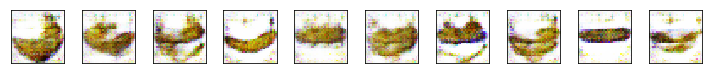

Epoch:  41/100 Discriminator Loss: 14.9508  Generator Loss: 11.2873
Epoch:  42/100 Discriminator Loss: 11.6932  Generator Loss:  6.2776
Epoch:  43/100 Discriminator Loss: 13.3041  Generator Loss:  8.0456
Epoch:  44/100 Discriminator Loss: 13.6199  Generator Loss: 10.7415
Epoch:  45/100 Discriminator Loss: 10.0606  Generator Loss:  6.3544


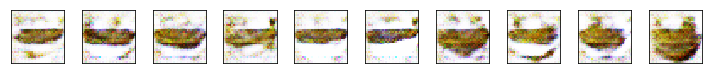

Epoch:  46/100 Discriminator Loss:  9.8979  Generator Loss:  4.8846
Epoch:  47/100 Discriminator Loss: 15.5828  Generator Loss: 12.8592
Epoch:  48/100 Discriminator Loss: 10.1529  Generator Loss:  7.8456
Epoch:  49/100 Discriminator Loss: 15.7793  Generator Loss: 13.7122
Epoch:  50/100 Discriminator Loss:  8.7318  Generator Loss:  7.2991


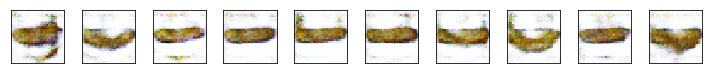

Epoch:  51/100 Discriminator Loss: 10.0116  Generator Loss:  7.0579
Epoch:  52/100 Discriminator Loss:  8.3242  Generator Loss:  6.3430
Epoch:  53/100 Discriminator Loss:  7.7349  Generator Loss:  5.2638
Epoch:  54/100 Discriminator Loss:  6.0644  Generator Loss:  3.8604
Epoch:  55/100 Discriminator Loss:  7.5828  Generator Loss:  4.2225


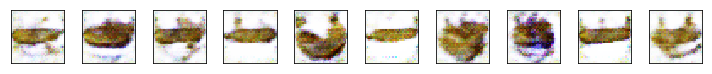

Epoch:  56/100 Discriminator Loss:  7.1767  Generator Loss:  4.3916
Epoch:  57/100 Discriminator Loss:  9.5850  Generator Loss:  6.7443
Epoch:  58/100 Discriminator Loss:  4.6240  Generator Loss:  3.2899
Epoch:  59/100 Discriminator Loss:  7.5100  Generator Loss:  6.6696
Epoch:  60/100 Discriminator Loss:  9.2263  Generator Loss:  6.6323


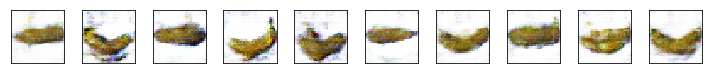

Epoch:  61/100 Discriminator Loss: 15.6012  Generator Loss: 14.9394
Epoch:  62/100 Discriminator Loss:  9.2701  Generator Loss:  5.9435
Epoch:  63/100 Discriminator Loss: 10.1771  Generator Loss:  6.4591
Epoch:  64/100 Discriminator Loss: 11.6484  Generator Loss: 10.7234
Epoch:  65/100 Discriminator Loss:  7.0475  Generator Loss:  5.4444


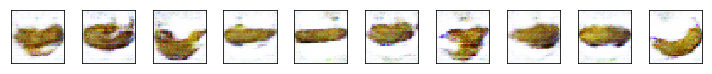

Epoch:  66/100 Discriminator Loss:  5.1069  Generator Loss:  3.4598
Epoch:  67/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  68/100 Discriminator Loss: 16.1181  Generator Loss: 15.5668
Epoch:  69/100 Discriminator Loss: 10.9005  Generator Loss:  9.8736
Epoch:  70/100 Discriminator Loss:  8.6642  Generator Loss:  7.6647


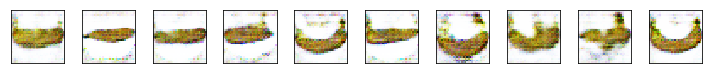

Epoch:  71/100 Discriminator Loss:  4.6028  Generator Loss:  5.1226
Epoch:  72/100 Discriminator Loss:  3.7161  Generator Loss:  3.0343
Epoch:  73/100 Discriminator Loss:  1.1930  Generator Loss:  1.6063
Epoch:  74/100 Discriminator Loss: 11.0723  Generator Loss:  9.7781
Epoch:  75/100 Discriminator Loss:  2.5718  Generator Loss:  1.9324


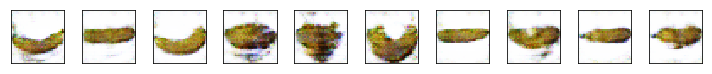

Epoch:  76/100 Discriminator Loss:  2.9276  Generator Loss:  3.2823
Epoch:  77/100 Discriminator Loss:  2.3518  Generator Loss:  2.9529
Epoch:  78/100 Discriminator Loss:  3.0295  Generator Loss:  3.6149
Epoch:  79/100 Discriminator Loss:  2.1160  Generator Loss:  2.6012
Epoch:  80/100 Discriminator Loss:  2.4845  Generator Loss:  2.8156


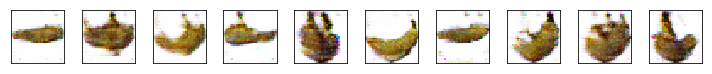

Epoch:  81/100 Discriminator Loss:  3.1361  Generator Loss:  3.7829
Epoch:  82/100 Discriminator Loss:  2.6533  Generator Loss:  2.9350
Epoch:  83/100 Discriminator Loss:  8.1099  Generator Loss:  8.5364
Epoch:  84/100 Discriminator Loss:  3.0073  Generator Loss:  2.5705
Epoch:  85/100 Discriminator Loss:  3.0030  Generator Loss:  1.7952


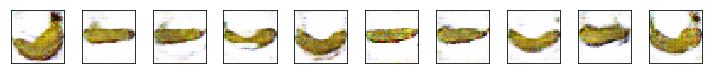

Epoch:  86/100 Discriminator Loss:  3.3861  Generator Loss:  3.3336
Epoch:  87/100 Discriminator Loss:  6.7022  Generator Loss:  6.6065
Epoch:  88/100 Discriminator Loss:  3.6800  Generator Loss:  3.9887
Epoch:  89/100 Discriminator Loss:  3.8837  Generator Loss:  3.6241
Epoch:  90/100 Discriminator Loss: 15.3887  Generator Loss: 12.9090


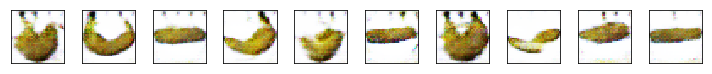

Epoch:  91/100 Discriminator Loss:  7.3598  Generator Loss:  5.9567
Epoch:  92/100 Discriminator Loss:  5.7725  Generator Loss:  4.9351
Epoch:  93/100 Discriminator Loss:  3.6235  Generator Loss:  2.9095
Epoch:  94/100 Discriminator Loss:  5.1599  Generator Loss:  5.5869
Epoch:  95/100 Discriminator Loss:  5.3992  Generator Loss:  5.7087


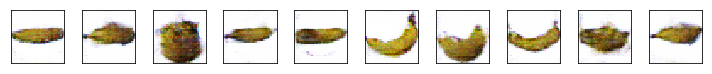

Epoch:  96/100 Discriminator Loss:  6.0219  Generator Loss:  6.3729
Epoch:  97/100 Discriminator Loss:  2.9639  Generator Loss:  4.1223
Epoch:  98/100 Discriminator Loss:  7.5217  Generator Loss:  7.2259
Epoch:  99/100 Discriminator Loss:  3.8598  Generator Loss:  3.3521
Epoch: 100/100 Discriminator Loss:  4.8915  Generator Loss:  3.5737


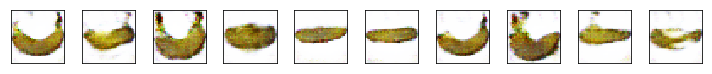

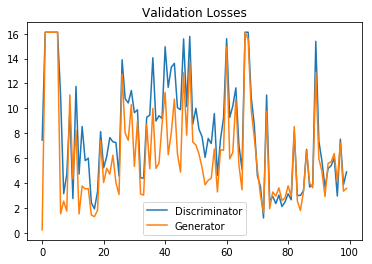

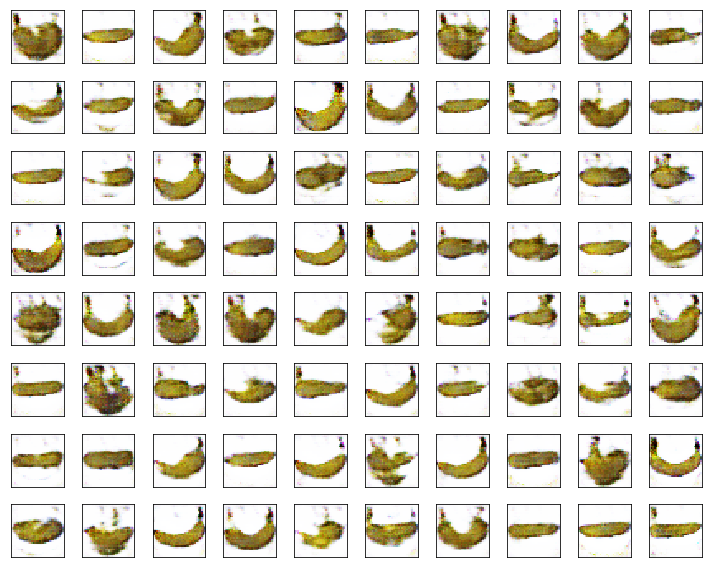

In [0]:
#Dropped batch to 32 and eval to 12

train(g_learning_rate=0.0001, g_beta_1=0.3, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:   2/100 Discriminator Loss:  0.7390  Generator Loss:  6.2919
Epoch:   3/100 Discriminator Loss:  2.6603  Generator Loss:  2.8626
Epoch:   4/100 Discriminator Loss:  0.7156  Generator Loss:  1.8443
Epoch:   5/100 Discriminator Loss:  5.2876  Generator Loss:  4.6169


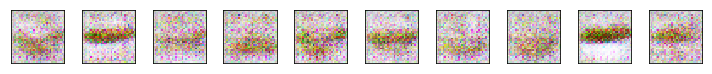

Epoch:   6/100 Discriminator Loss:  0.3938  Generator Loss:  2.8327
Epoch:   7/100 Discriminator Loss:  3.7240  Generator Loss:  3.4895
Epoch:   8/100 Discriminator Loss:  1.9224  Generator Loss:  2.3906
Epoch:   9/100 Discriminator Loss:  3.7357  Generator Loss:  4.8593
Epoch:  10/100 Discriminator Loss:  4.1164  Generator Loss:  5.2046


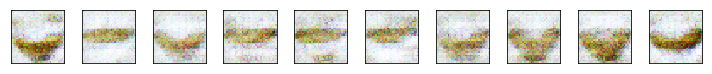

Epoch:  11/100 Discriminator Loss:  4.7515  Generator Loss:  4.3133
Epoch:  12/100 Discriminator Loss:  7.1927  Generator Loss:  5.3287
Epoch:  13/100 Discriminator Loss:  6.1651  Generator Loss:  5.1009
Epoch:  14/100 Discriminator Loss:  5.9265  Generator Loss:  5.2044
Epoch:  15/100 Discriminator Loss:  3.2802  Generator Loss:  6.0923


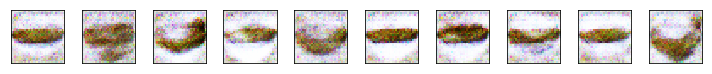

Epoch:  16/100 Discriminator Loss:  6.6254  Generator Loss:  9.7707
Epoch:  17/100 Discriminator Loss:  8.0057  Generator Loss:  5.4904
Epoch:  18/100 Discriminator Loss:  6.4888  Generator Loss:  3.2895
Epoch:  19/100 Discriminator Loss: 11.0100  Generator Loss: 10.5169
Epoch:  20/100 Discriminator Loss: 12.6040  Generator Loss:  9.7024


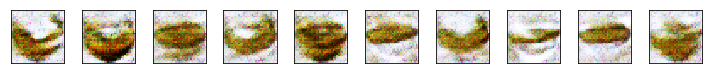

Epoch:  21/100 Discriminator Loss:  8.3995  Generator Loss:  6.4036
Epoch:  22/100 Discriminator Loss:  6.6242  Generator Loss:  5.0222
Epoch:  23/100 Discriminator Loss:  6.1276  Generator Loss:  6.0717
Epoch:  24/100 Discriminator Loss:  6.7948  Generator Loss:  6.2990
Epoch:  25/100 Discriminator Loss:  7.4201  Generator Loss:  5.8336


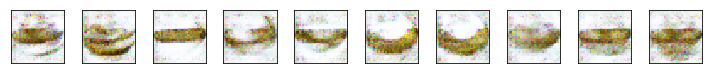

Epoch:  26/100 Discriminator Loss:  5.7544  Generator Loss:  8.1353
Epoch:  27/100 Discriminator Loss:  7.7436  Generator Loss:  5.3230
Epoch:  28/100 Discriminator Loss: 10.7498  Generator Loss:  6.6383
Epoch:  29/100 Discriminator Loss:  6.9582  Generator Loss:  6.0892
Epoch:  30/100 Discriminator Loss:  8.3252  Generator Loss:  4.3554


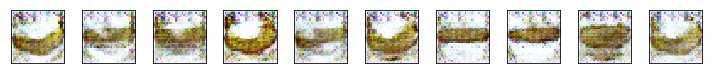

Epoch:  31/100 Discriminator Loss: 15.1486  Generator Loss:  9.8176
Epoch:  32/100 Discriminator Loss: 10.5823  Generator Loss:  5.5252
Epoch:  33/100 Discriminator Loss: 14.9136  Generator Loss: 11.7988
Epoch:  34/100 Discriminator Loss: 15.3306  Generator Loss: 10.3687
Epoch:  35/100 Discriminator Loss: 12.1831  Generator Loss: 13.5244


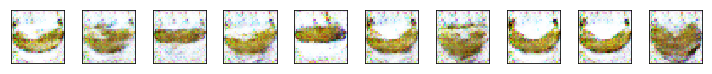

Epoch:  36/100 Discriminator Loss: 12.4988  Generator Loss:  7.1792
Epoch:  37/100 Discriminator Loss: 13.9165  Generator Loss: 12.0670
Epoch:  38/100 Discriminator Loss: 11.5810  Generator Loss:  9.1552
Epoch:  39/100 Discriminator Loss: 14.6766  Generator Loss:  7.9231
Epoch:  40/100 Discriminator Loss:  8.9435  Generator Loss:  5.6759


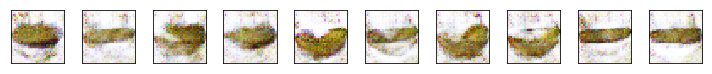

Epoch:  41/100 Discriminator Loss: 13.0426  Generator Loss:  8.6147
Epoch:  42/100 Discriminator Loss: 10.9212  Generator Loss:  8.4836
Epoch:  43/100 Discriminator Loss:  9.8756  Generator Loss:  6.2774
Epoch:  44/100 Discriminator Loss: 13.2441  Generator Loss:  9.2082
Epoch:  45/100 Discriminator Loss:  9.5507  Generator Loss:  6.0695


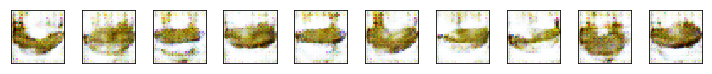

Epoch:  46/100 Discriminator Loss:  4.3868  Generator Loss:  3.6241
Epoch:  47/100 Discriminator Loss:  6.5102  Generator Loss:  4.2512
Epoch:  48/100 Discriminator Loss:  5.8182  Generator Loss:  3.8177
Epoch:  49/100 Discriminator Loss:  5.8419  Generator Loss:  3.2341
Epoch:  50/100 Discriminator Loss: 11.1487  Generator Loss:  9.1404


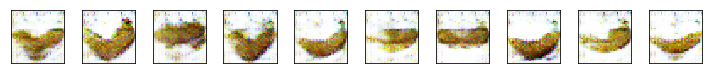

Epoch:  51/100 Discriminator Loss:  8.4545  Generator Loss:  7.2813
Epoch:  52/100 Discriminator Loss:  6.9116  Generator Loss:  4.5815
Epoch:  53/100 Discriminator Loss:  5.9517  Generator Loss:  3.1558
Epoch:  54/100 Discriminator Loss:  5.2308  Generator Loss:  3.3253
Epoch:  55/100 Discriminator Loss:  6.4728  Generator Loss:  4.5597


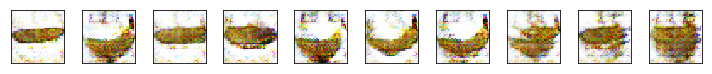

Epoch:  56/100 Discriminator Loss:  8.6052  Generator Loss:  6.6082
Epoch:  57/100 Discriminator Loss:  6.7009  Generator Loss:  5.0927
Epoch:  58/100 Discriminator Loss:  8.8471  Generator Loss:  5.0893
Epoch:  59/100 Discriminator Loss: 12.4617  Generator Loss: 10.9767
Epoch:  60/100 Discriminator Loss: 10.4044  Generator Loss:  8.5744


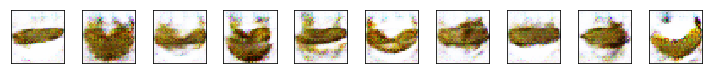

Epoch:  61/100 Discriminator Loss: 10.8988  Generator Loss:  7.6113
Epoch:  62/100 Discriminator Loss: 10.6622  Generator Loss:  7.8778
Epoch:  63/100 Discriminator Loss: 11.5671  Generator Loss:  8.6203
Epoch:  64/100 Discriminator Loss: 14.1925  Generator Loss: 12.7284
Epoch:  65/100 Discriminator Loss:  6.7238  Generator Loss:  5.1272


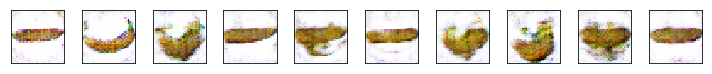

Epoch:  66/100 Discriminator Loss: 11.2864  Generator Loss:  9.2948
Epoch:  67/100 Discriminator Loss:  7.1908  Generator Loss:  4.8664
Epoch:  68/100 Discriminator Loss:  2.8119  Generator Loss:  4.0477
Epoch:  69/100 Discriminator Loss:  7.8280  Generator Loss:  6.3343
Epoch:  70/100 Discriminator Loss:  7.1037  Generator Loss:  5.6326


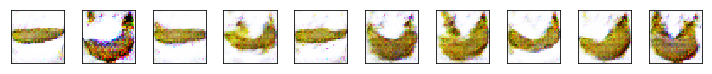

Epoch:  71/100 Discriminator Loss:  7.4600  Generator Loss:  7.6990
Epoch:  72/100 Discriminator Loss: 10.0224  Generator Loss: 10.6459
Epoch:  73/100 Discriminator Loss: 10.4712  Generator Loss: 10.7256
Epoch:  74/100 Discriminator Loss: 10.2572  Generator Loss:  8.5695
Epoch:  75/100 Discriminator Loss: 10.0642  Generator Loss:  8.8395


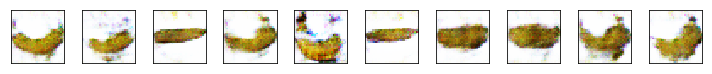

Epoch:  76/100 Discriminator Loss:  8.3120  Generator Loss:  7.4833
Epoch:  77/100 Discriminator Loss:  7.7143  Generator Loss:  5.9833
Epoch:  78/100 Discriminator Loss:  6.3775  Generator Loss:  5.2773
Epoch:  79/100 Discriminator Loss:  4.7465  Generator Loss:  5.4453
Epoch:  80/100 Discriminator Loss:  5.6624  Generator Loss:  5.8963


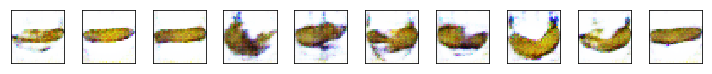

Epoch:  81/100 Discriminator Loss:  6.4278  Generator Loss:  6.0655
Epoch:  82/100 Discriminator Loss:  5.3212  Generator Loss:  4.0692
Epoch:  83/100 Discriminator Loss:  4.2567  Generator Loss:  5.3554
Epoch:  84/100 Discriminator Loss:  7.1147  Generator Loss:  6.0584
Epoch:  85/100 Discriminator Loss: 14.1836  Generator Loss: 14.3727


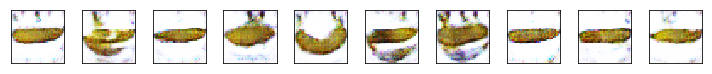

Epoch:  86/100 Discriminator Loss:  7.1458  Generator Loss:  6.0707
Epoch:  87/100 Discriminator Loss:  7.1089  Generator Loss:  5.6695
Epoch:  88/100 Discriminator Loss:  6.9066  Generator Loss:  5.5817
Epoch:  89/100 Discriminator Loss:  9.9559  Generator Loss:  9.4567
Epoch:  90/100 Discriminator Loss: 12.1629  Generator Loss: 10.8681


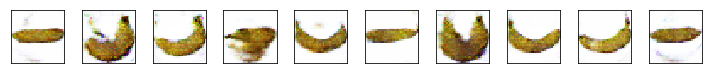

Epoch:  91/100 Discriminator Loss:  7.6719  Generator Loss:  8.0570
Epoch:  92/100 Discriminator Loss:  6.5998  Generator Loss:  6.3253
Epoch:  93/100 Discriminator Loss:  6.5679  Generator Loss:  6.4718
Epoch:  94/100 Discriminator Loss:  6.4309  Generator Loss:  5.1237
Epoch:  95/100 Discriminator Loss:  5.1378  Generator Loss:  5.7612


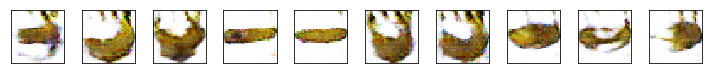

Epoch:  96/100 Discriminator Loss:  4.6623  Generator Loss:  5.4720
Epoch:  97/100 Discriminator Loss:  6.8218  Generator Loss:  5.3744
Epoch:  98/100 Discriminator Loss:  7.0099  Generator Loss:  5.5858
Epoch:  99/100 Discriminator Loss: 13.7703  Generator Loss: 11.2887
Epoch: 100/100 Discriminator Loss:  3.0769  Generator Loss:  4.3024


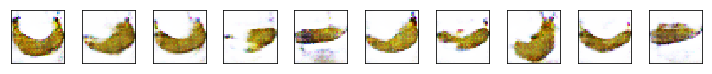

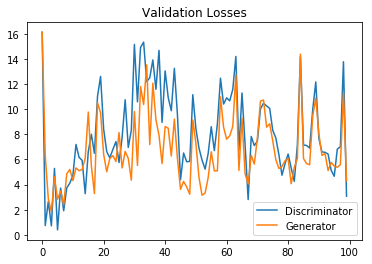

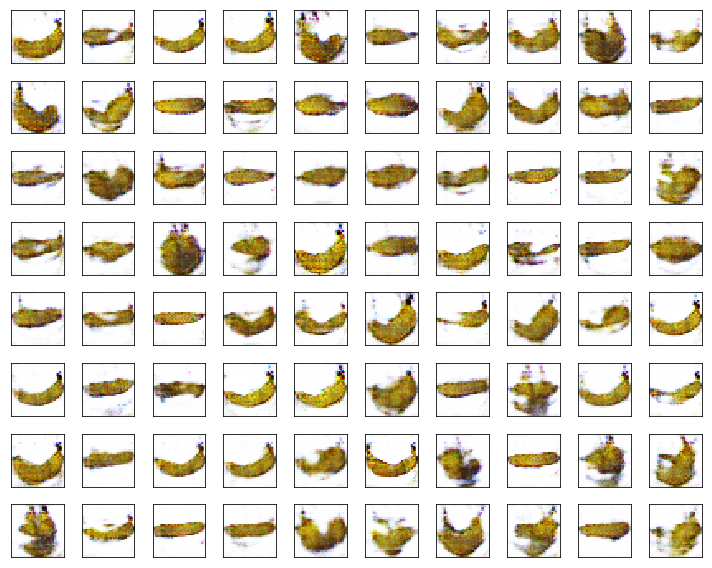

In [0]:
#Dropped batch to 32 and eval to 12

train(g_learning_rate=0.0001, g_beta_1=0.3, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  4.1275  Generator Loss:  9.6191
Epoch:   2/100 Discriminator Loss: 15.6218  Generator Loss: 16.1181
Epoch:   3/100 Discriminator Loss: 12.2681  Generator Loss: 16.1181
Epoch:   4/100 Discriminator Loss:  2.3421  Generator Loss:  1.5199
Epoch:   5/100 Discriminator Loss:  2.1279  Generator Loss:  1.5019


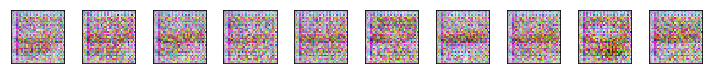

Epoch:   6/100 Discriminator Loss:  2.5968  Generator Loss:  4.2087
Epoch:   7/100 Discriminator Loss:  9.6918  Generator Loss:  8.4075
Epoch:   8/100 Discriminator Loss:  3.3478  Generator Loss:  2.2150
Epoch:   9/100 Discriminator Loss:  4.0134  Generator Loss:  1.8037
Epoch:  10/100 Discriminator Loss:  6.0284  Generator Loss:  3.1991


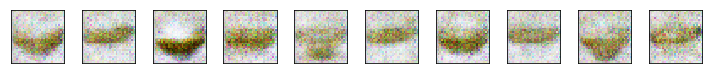

Epoch:  11/100 Discriminator Loss:  5.1931  Generator Loss:  2.7686
Epoch:  12/100 Discriminator Loss:  6.1499  Generator Loss:  4.7955
Epoch:  13/100 Discriminator Loss:  3.7194  Generator Loss:  4.8905
Epoch:  14/100 Discriminator Loss:  4.1845  Generator Loss:  3.8222
Epoch:  15/100 Discriminator Loss:  9.3009  Generator Loss:  4.2993


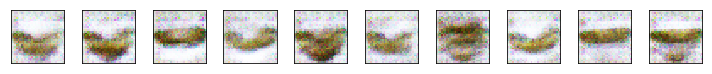

Epoch:  16/100 Discriminator Loss: 16.0271  Generator Loss: 13.2167
Epoch:  17/100 Discriminator Loss: 10.6817  Generator Loss:  4.8792
Epoch:  18/100 Discriminator Loss:  7.3259  Generator Loss:  2.9924
Epoch:  19/100 Discriminator Loss:  6.1872  Generator Loss:  4.6922
Epoch:  20/100 Discriminator Loss: 16.1181  Generator Loss: 15.7035


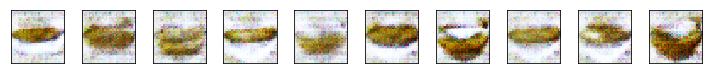

Epoch:  21/100 Discriminator Loss:  6.5193  Generator Loss:  3.7738
Epoch:  22/100 Discriminator Loss: 15.2241  Generator Loss:  8.9745
Epoch:  23/100 Discriminator Loss: 11.2244  Generator Loss:  5.7767
Epoch:  24/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  25/100 Discriminator Loss: 15.5400  Generator Loss: 12.2919


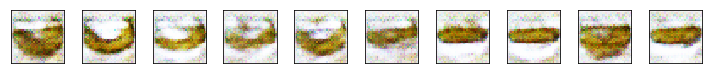

Epoch:  26/100 Discriminator Loss: 13.4378  Generator Loss: 10.3769
Epoch:  27/100 Discriminator Loss: 12.5780  Generator Loss: 10.0230
Epoch:  28/100 Discriminator Loss: 12.5384  Generator Loss:  7.8536
Epoch:  29/100 Discriminator Loss: 11.3070  Generator Loss:  6.3491
Epoch:  30/100 Discriminator Loss: 16.1181  Generator Loss: 15.2467


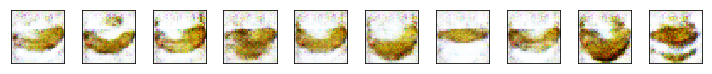

Epoch:  31/100 Discriminator Loss: 12.7050  Generator Loss: 10.7504
Epoch:  32/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  33/100 Discriminator Loss:  3.7022  Generator Loss:  2.9317
Epoch:  34/100 Discriminator Loss:  3.8270  Generator Loss:  2.6183
Epoch:  35/100 Discriminator Loss:  5.7868  Generator Loss:  3.8215


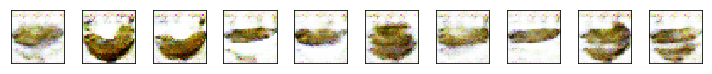

Epoch:  36/100 Discriminator Loss: 13.8081  Generator Loss:  9.0062
Epoch:  37/100 Discriminator Loss:  2.2677  Generator Loss:  2.3423
Epoch:  38/100 Discriminator Loss: 11.3541  Generator Loss:  7.3513
Epoch:  39/100 Discriminator Loss:  5.2236  Generator Loss:  3.2637
Epoch:  40/100 Discriminator Loss: 13.7718  Generator Loss:  9.6239


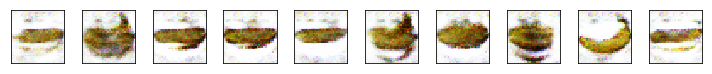

Epoch:  41/100 Discriminator Loss: 10.7846  Generator Loss:  8.1480
Epoch:  42/100 Discriminator Loss: 13.8390  Generator Loss:  9.2938
Epoch:  43/100 Discriminator Loss:  4.5921  Generator Loss:  2.7100
Epoch:  44/100 Discriminator Loss:  8.6581  Generator Loss:  5.5211
Epoch:  45/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181


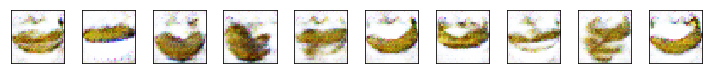

Epoch:  46/100 Discriminator Loss: 12.8142  Generator Loss:  9.4927
Epoch:  47/100 Discriminator Loss:  4.0873  Generator Loss:  3.2113
Epoch:  48/100 Discriminator Loss:  2.6510  Generator Loss:  2.7290
Epoch:  49/100 Discriminator Loss:  1.1222  Generator Loss:  1.3588
Epoch:  50/100 Discriminator Loss:  2.9108  Generator Loss:  1.5801


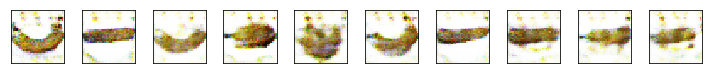

Epoch:  51/100 Discriminator Loss:  8.7225  Generator Loss:  6.2270
Epoch:  52/100 Discriminator Loss:  6.5708  Generator Loss:  4.6084
Epoch:  53/100 Discriminator Loss:  3.6472  Generator Loss:  2.8540
Epoch:  54/100 Discriminator Loss: 16.1181  Generator Loss: 15.4861
Epoch:  55/100 Discriminator Loss:  5.3014  Generator Loss:  3.6183


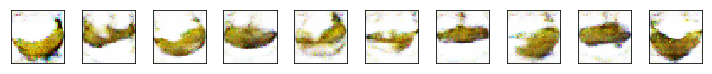

Epoch:  56/100 Discriminator Loss:  1.3348  Generator Loss:  1.5417
Epoch:  57/100 Discriminator Loss:  1.1925  Generator Loss:  2.2843
Epoch:  58/100 Discriminator Loss:  2.6667  Generator Loss:  1.9697
Epoch:  59/100 Discriminator Loss: 14.8806  Generator Loss: 14.9533
Epoch:  60/100 Discriminator Loss:  8.9168  Generator Loss:  6.6869


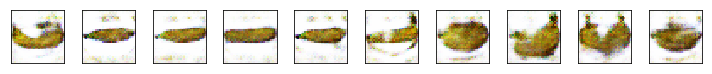

Epoch:  61/100 Discriminator Loss:  4.0500  Generator Loss:  2.6906
Epoch:  62/100 Discriminator Loss:  1.5974  Generator Loss:  1.4221
Epoch:  63/100 Discriminator Loss:  2.1943  Generator Loss:  1.5746
Epoch:  64/100 Discriminator Loss: 12.9382  Generator Loss: 13.9829
Epoch:  65/100 Discriminator Loss:  1.7321  Generator Loss:  1.4949


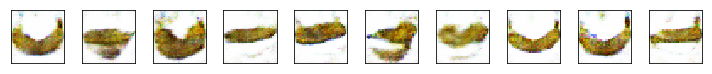

Epoch:  66/100 Discriminator Loss:  0.8979  Generator Loss:  1.9900
Epoch:  67/100 Discriminator Loss: 16.1181  Generator Loss: 16.1035
Epoch:  68/100 Discriminator Loss: 11.6686  Generator Loss: 11.0007
Epoch:  69/100 Discriminator Loss:  7.7137  Generator Loss:  6.6301
Epoch:  70/100 Discriminator Loss:  5.0044  Generator Loss:  4.1767


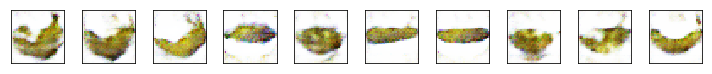

Epoch:  71/100 Discriminator Loss:  2.6143  Generator Loss:  3.2951
Epoch:  72/100 Discriminator Loss:  2.9899  Generator Loss:  3.1495
Epoch:  73/100 Discriminator Loss:  7.0332  Generator Loss:  6.2897
Epoch:  74/100 Discriminator Loss:  2.1964  Generator Loss:  2.6624
Epoch:  75/100 Discriminator Loss:  1.9583  Generator Loss:  2.0862


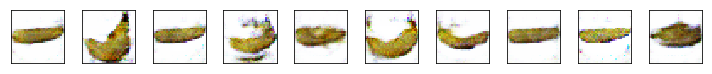

Epoch:  76/100 Discriminator Loss:  7.0627  Generator Loss:  6.4621
Epoch:  77/100 Discriminator Loss:  6.9012  Generator Loss:  4.8658
Epoch:  78/100 Discriminator Loss:  8.3775  Generator Loss:  6.1024
Epoch:  79/100 Discriminator Loss:  4.4330  Generator Loss:  3.0584
Epoch:  80/100 Discriminator Loss:  2.6645  Generator Loss:  2.0650


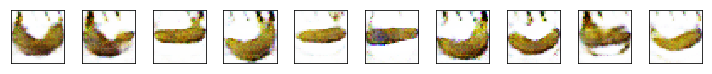

Epoch:  81/100 Discriminator Loss:  3.7615  Generator Loss:  3.8023
Epoch:  82/100 Discriminator Loss:  4.7274  Generator Loss:  4.1515
Epoch:  83/100 Discriminator Loss:  1.8937  Generator Loss:  2.7525
Epoch:  84/100 Discriminator Loss:  8.1591  Generator Loss:  7.2462
Epoch:  85/100 Discriminator Loss: 15.6517  Generator Loss: 13.8839


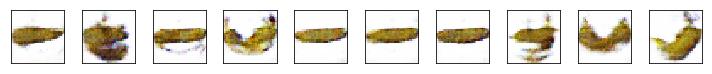

Epoch:  86/100 Discriminator Loss:  2.3295  Generator Loss:  1.5242
Epoch:  87/100 Discriminator Loss: 16.0119  Generator Loss: 14.3929
Epoch:  88/100 Discriminator Loss:  5.8057  Generator Loss:  5.5245
Epoch:  89/100 Discriminator Loss:  3.4608  Generator Loss:  2.4650
Epoch:  90/100 Discriminator Loss:  3.1492  Generator Loss:  2.1858


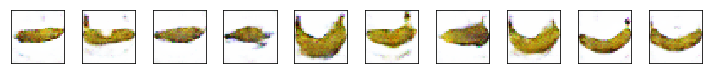

Epoch:  91/100 Discriminator Loss:  9.2577  Generator Loss:  6.8168
Epoch:  92/100 Discriminator Loss:  2.1965  Generator Loss:  2.7986
Epoch:  93/100 Discriminator Loss:  2.2473  Generator Loss:  4.3331
Epoch:  94/100 Discriminator Loss:  1.6343  Generator Loss:  1.1838
Epoch:  95/100 Discriminator Loss:  3.3056  Generator Loss:  4.0042


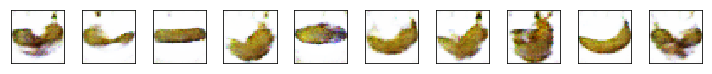

Epoch:  96/100 Discriminator Loss:  4.1877  Generator Loss:  4.2103
Epoch:  97/100 Discriminator Loss:  3.0686  Generator Loss:  3.4455
Epoch:  98/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  99/100 Discriminator Loss:  1.5225  Generator Loss:  1.4940
Epoch: 100/100 Discriminator Loss:  1.5441  Generator Loss:  1.5575


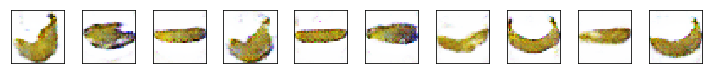

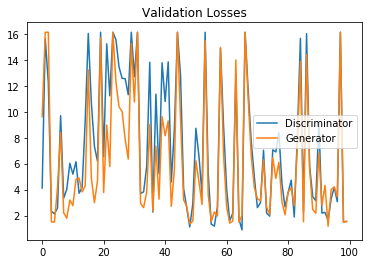

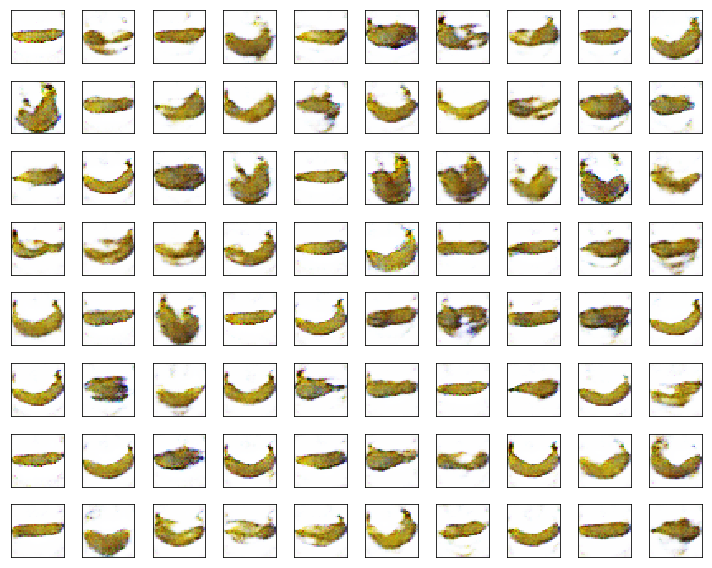

In [0]:
#Dropped batch to 32 and eval to 12

train(g_learning_rate=0.0001, g_beta_1=0.3, d_learning_rate=0.001, d_beta_1=0.3, leaky_alpha=0.2)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch:   1/100 Discriminator Loss:  3.0045  Generator Loss:  3.0084
Epoch:   2/100 Discriminator Loss:  4.5698  Generator Loss:  6.3421
Epoch:   3/100 Discriminator Loss: 15.5932  Generator Loss:  2.8206
Epoch:   4/100 Discriminator Loss: 15.6950  Generator Loss:  5.7794
Epoch:   5/100 Discriminator Loss:  5.4392  Generator Loss:  3.0983


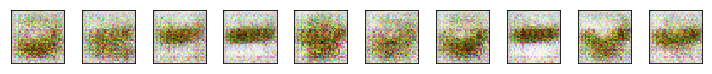

Epoch:   6/100 Discriminator Loss:  1.7153  Generator Loss:  2.3326
Epoch:   7/100 Discriminator Loss:  3.3301  Generator Loss:  3.1389
Epoch:   8/100 Discriminator Loss:  1.5883  Generator Loss:  1.7428
Epoch:   9/100 Discriminator Loss:  5.6624  Generator Loss:  6.3286
Epoch:  10/100 Discriminator Loss:  1.3389  Generator Loss:  1.6092


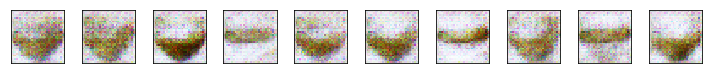

Epoch:  11/100 Discriminator Loss: 16.1181  Generator Loss: 14.8944
Epoch:  12/100 Discriminator Loss:  7.2916  Generator Loss:  4.6281
Epoch:  13/100 Discriminator Loss:  6.9817  Generator Loss:  5.8205
Epoch:  14/100 Discriminator Loss:  9.0147  Generator Loss:  5.8169
Epoch:  15/100 Discriminator Loss: 10.1649  Generator Loss:  5.1671


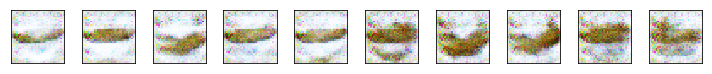

Epoch:  16/100 Discriminator Loss:  6.0180  Generator Loss:  7.2326
Epoch:  17/100 Discriminator Loss: 14.5454  Generator Loss: 10.6789
Epoch:  18/100 Discriminator Loss: 15.7409  Generator Loss: 13.7950
Epoch:  19/100 Discriminator Loss: 16.1181  Generator Loss: 16.1181
Epoch:  20/100 Discriminator Loss: 15.8853  Generator Loss: 13.9088


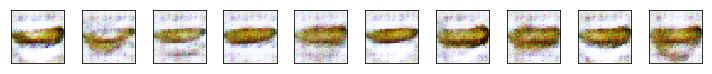

Epoch:  21/100 Discriminator Loss: 14.4132  Generator Loss: 10.7929
Epoch:  22/100 Discriminator Loss: 14.7610  Generator Loss:  8.5929
Epoch:  23/100 Discriminator Loss:  4.7105  Generator Loss:  3.0923
Epoch:  24/100 Discriminator Loss:  5.2597  Generator Loss:  3.2735
Epoch:  25/100 Discriminator Loss:  6.5204  Generator Loss:  3.0467


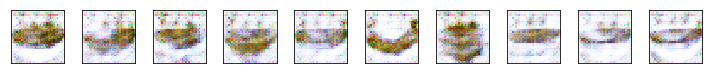

Epoch:  26/100 Discriminator Loss:  6.4281  Generator Loss:  2.9485
Epoch:  27/100 Discriminator Loss:  9.3687  Generator Loss:  5.1407
Epoch:  28/100 Discriminator Loss:  4.6639  Generator Loss:  5.0650
Epoch:  29/100 Discriminator Loss:  7.3805  Generator Loss:  5.9816
Epoch:  30/100 Discriminator Loss:  7.0376  Generator Loss:  4.0394


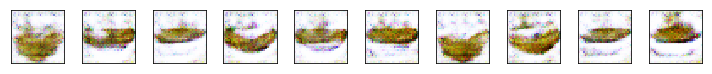

Epoch:  31/100 Discriminator Loss: 16.0119  Generator Loss: 15.5400
Epoch:  32/100 Discriminator Loss: 11.8725  Generator Loss:  9.5708
Epoch:  33/100 Discriminator Loss: 11.0475  Generator Loss:  7.5018
Epoch:  34/100 Discriminator Loss: 14.3277  Generator Loss:  8.6352
Epoch:  35/100 Discriminator Loss:  8.9677  Generator Loss:  5.9797


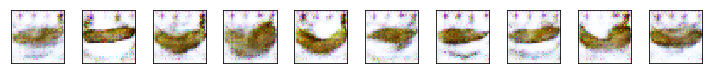

Epoch:  36/100 Discriminator Loss:  6.8697  Generator Loss:  4.3326
Epoch:  37/100 Discriminator Loss: 11.5806  Generator Loss:  6.1704
Epoch:  38/100 Discriminator Loss:  9.1273  Generator Loss:  6.7013
Epoch:  39/100 Discriminator Loss: 10.3683  Generator Loss:  5.5067
Epoch:  40/100 Discriminator Loss: 12.9117  Generator Loss: 10.2089


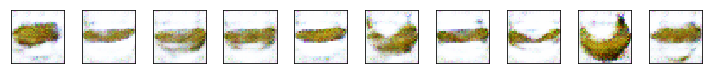

Epoch:  41/100 Discriminator Loss: 12.6850  Generator Loss:  9.6386
Epoch:  42/100 Discriminator Loss: 16.1181  Generator Loss: 15.8459
Epoch:  43/100 Discriminator Loss: 15.6869  Generator Loss: 14.0906
Epoch:  44/100 Discriminator Loss: 13.1474  Generator Loss: 10.0870
Epoch:  45/100 Discriminator Loss:  8.9363  Generator Loss:  4.9617


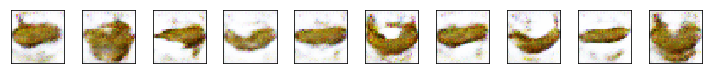

Epoch:  46/100 Discriminator Loss: 10.9423  Generator Loss:  7.1232
Epoch:  47/100 Discriminator Loss:  9.7347  Generator Loss:  6.3726
Epoch:  48/100 Discriminator Loss:  8.7599  Generator Loss:  5.0870
Epoch:  49/100 Discriminator Loss: 15.4210  Generator Loss: 11.6186
Epoch:  50/100 Discriminator Loss: 13.0806  Generator Loss:  6.3941


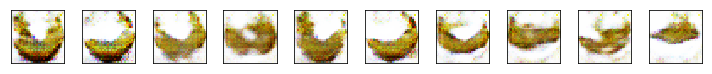

Epoch:  51/100 Discriminator Loss: 12.3084  Generator Loss:  7.8577
Epoch:  52/100 Discriminator Loss:  2.5172  Generator Loss:  1.6880
Epoch:  53/100 Discriminator Loss:  3.2912  Generator Loss:  2.3864
Epoch:  54/100 Discriminator Loss:  5.3028  Generator Loss:  3.1703
Epoch:  55/100 Discriminator Loss:  1.9260  Generator Loss:  1.7445


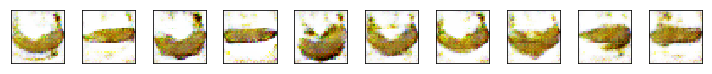

Epoch:  56/100 Discriminator Loss:  5.7541  Generator Loss:  3.6790
Epoch:  57/100 Discriminator Loss: 10.5775  Generator Loss:  5.9785
Epoch:  58/100 Discriminator Loss:  5.8376  Generator Loss:  4.6108
Epoch:  59/100 Discriminator Loss: 12.4361  Generator Loss:  8.4109
Epoch:  60/100 Discriminator Loss:  6.5021  Generator Loss:  3.6661


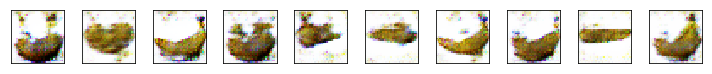

Epoch:  61/100 Discriminator Loss:  9.2974  Generator Loss:  5.5312
Epoch:  62/100 Discriminator Loss:  2.2242  Generator Loss:  3.8445
Epoch:  63/100 Discriminator Loss:  6.7203  Generator Loss:  5.4251
Epoch:  64/100 Discriminator Loss: 11.4270  Generator Loss: 11.3637
Epoch:  65/100 Discriminator Loss:  9.7059  Generator Loss:  7.6109


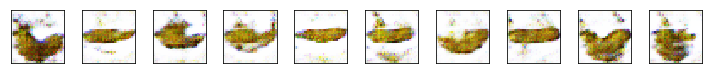

Epoch:  66/100 Discriminator Loss:  7.8865  Generator Loss:  4.7821
Epoch:  67/100 Discriminator Loss: 13.5194  Generator Loss: 10.2432
Epoch:  68/100 Discriminator Loss:  9.3483  Generator Loss:  9.7430
Epoch:  69/100 Discriminator Loss: 11.0476  Generator Loss:  8.9993
Epoch:  70/100 Discriminator Loss:  7.1662  Generator Loss:  5.7231


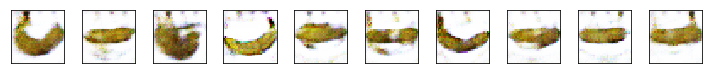

Epoch:  71/100 Discriminator Loss: 10.4052  Generator Loss:  8.2106
Epoch:  72/100 Discriminator Loss:  4.7592  Generator Loss:  4.5123
Epoch:  73/100 Discriminator Loss:  3.1862  Generator Loss:  4.3570
Epoch:  74/100 Discriminator Loss:  8.9456  Generator Loss:  8.2679
Epoch:  75/100 Discriminator Loss:  8.1658  Generator Loss:  5.9610


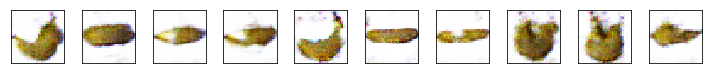

Epoch:  76/100 Discriminator Loss:  6.0307  Generator Loss:  6.0252
Epoch:  77/100 Discriminator Loss:  4.0780  Generator Loss:  4.6133
Epoch:  78/100 Discriminator Loss:  4.0229  Generator Loss:  5.3325
Epoch:  79/100 Discriminator Loss:  3.7957  Generator Loss:  3.9627
Epoch:  80/100 Discriminator Loss:  3.9372  Generator Loss:  3.0201


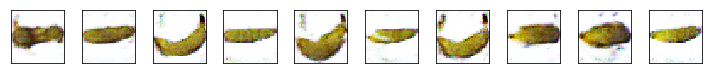

Epoch:  81/100 Discriminator Loss:  2.7315  Generator Loss:  2.2108
Epoch:  82/100 Discriminator Loss:  7.0069  Generator Loss:  5.6671
Epoch:  83/100 Discriminator Loss:  3.3216  Generator Loss:  3.3717
Epoch:  84/100 Discriminator Loss:  3.0745  Generator Loss:  2.8480
Epoch:  85/100 Discriminator Loss:  4.1734  Generator Loss:  4.1172


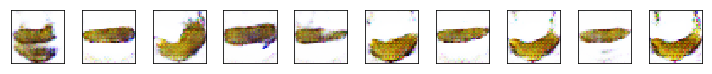

Epoch:  86/100 Discriminator Loss:  1.7003  Generator Loss:  1.9918
Epoch:  87/100 Discriminator Loss:  8.9917  Generator Loss:  8.4281
Epoch:  88/100 Discriminator Loss:  7.3893  Generator Loss:  6.9593
Epoch:  89/100 Discriminator Loss:  9.1112  Generator Loss:  7.4150
Epoch:  90/100 Discriminator Loss:  4.8903  Generator Loss:  4.7049


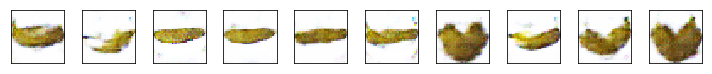

Epoch:  91/100 Discriminator Loss:  7.9078  Generator Loss:  6.0327
Epoch:  92/100 Discriminator Loss:  6.5094  Generator Loss:  6.2878
Epoch:  93/100 Discriminator Loss:  5.5236  Generator Loss:  4.4798
Epoch:  94/100 Discriminator Loss:  8.3157  Generator Loss:  6.5903
Epoch:  95/100 Discriminator Loss:  4.2001  Generator Loss:  4.8952


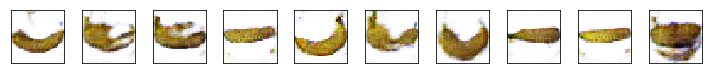

Epoch:  96/100 Discriminator Loss:  6.2865  Generator Loss:  4.9839
Epoch:  97/100 Discriminator Loss:  7.5560  Generator Loss:  6.3945
Epoch:  98/100 Discriminator Loss:  9.9923  Generator Loss:  9.3764
Epoch:  99/100 Discriminator Loss:  7.8395  Generator Loss:  6.4826
Epoch: 100/100 Discriminator Loss:  7.2908  Generator Loss:  6.5865


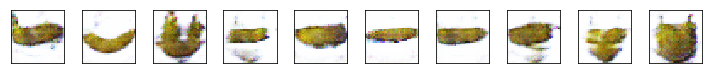

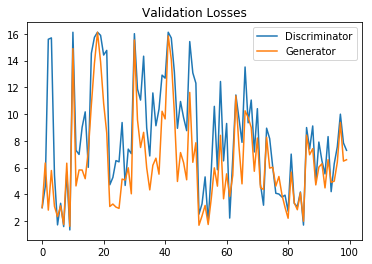

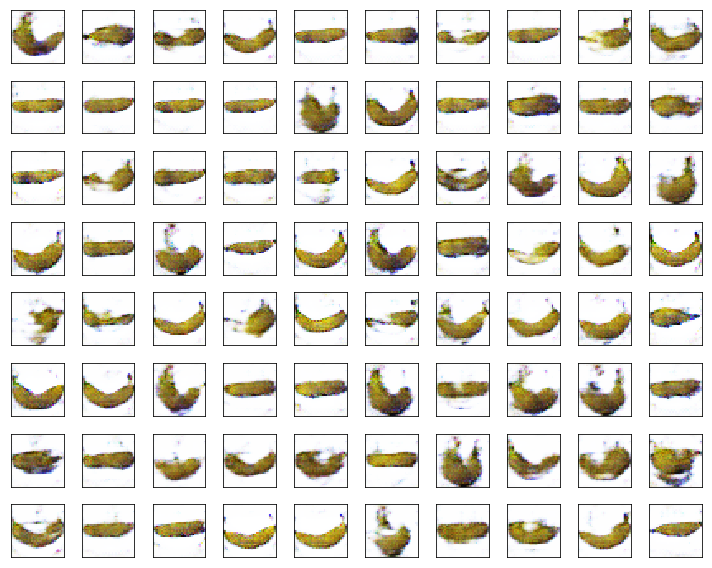

In [0]:
#Dropped batch to 32 and eval to 12

train(g_learning_rate=0.0001, g_beta_1=0.4, d_learning_rate=0.001, d_beta_1=0.4, leaky_alpha=0.2)